# Load Libraries

In [1]:
# numpy and pandas
import numpy as np
import pandas as pd
import math

# Generic
import os
import matplotlib.pyplot as plt
from IPython.display import clear_output

# Images
from PIL import Image
from skimage.transform import resize
import cv2
# import talos as ta

# Sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, confusion_matrix, plot_confusion_matrix, roc_curve


# Tensorflow
import tensorflow as tf
# import tensorflow.compat.v1 as tf

# Keras
from keras.layers import Input, Dense, Dropout, BatchNormalization
from keras.utils import print_summary
from keras.models import Model, load_model
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping, ReduceLROnPlateau, Callback
from keras.applications.densenet import DenseNet121
from keras.applications.densenet import preprocess_input
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
from keras import metrics
from matplotlib.ticker import MaxNLocator

Using TensorFlow backend.


# Global Parameters

In [2]:
perc_split = [0.7, 0.3, 0.0]
input_shape = (224, 224, 3)
seed = 1234
os.environ["CUDA_VISIBLE_DEVICES"]="1"

### Hyperparameters
batch_size = 64
epochs = 1000
learning_rate = 0.0001


# Load Classes and Functions

In [3]:
# chexNet weights
chexnet_weights = '/home/ygala/TFM_UOC/scripts/chexnet/best_weights.h5'

def chexnet_preprocess_input(value):
    return preprocess_input(value)


def get_chexnet_model():
    input_shape = (224, 224, 3)
    img_input = Input(shape=input_shape)
    base_weights = 'imagenet'

    # create the base pre-trained model
    base_model = DenseNet121(
        include_top=False,
        input_tensor=img_input,
        input_shape=input_shape,
        weights=base_weights,
        pooling='avg'
    )

    x = base_model.output
    # add a logistic layer -- let's say we have 14 classes
    predictions = Dense(
        14,
        activation='sigmoid',
        name='predictions')(x)

    # this is the model we will use
    model = Model(
        inputs=img_input,
        outputs=predictions,
    )

    # load chexnet weights
    model.load_weights(chexnet_weights)

    # return model
    return base_model, model

In [4]:
### funciones

def get_class_weight(csv_file_path, target_class):
    df = pd.read_csv(csv_file_path, sep=';')
    total_counts = df.shape[0]
    class_weight = []

    ratio_pos = df.loc[(df[target_class] == 'Y')].shape[0] / total_counts
    ratio_neg = df.loc[(df[target_class] == 'N')].shape[0] / total_counts
    class_weight = np.array((ratio_pos, ratio_neg))
        
    return class_weight

def auc(y_true, y_pred):
    auc = tf.metrics.auc(y_true, y_pred)[1]
    K.get_session().run(tf.local_variables_initializer())
    return auc



def bootstrap_auc(y, pred, bootstraps = 100, fold_size = 1000):
    statistics = np.zeros(bootstraps)   
    df = pd.DataFrame(columns=['y', 'pred'])
    df.loc[:, 'y'] = y
    df.loc[:, 'pred'] = pred
    # get positive examples for stratified sampling
    df_pos = df[df.y == 1]
    df_neg = df[df.y == 0]
    prevalence = len(df_pos) / len(df)
    for i in range(bootstraps):
        # stratified sampling of positive and negative examples
        pos_sample = df_pos.sample(n = int(fold_size * prevalence), replace=True)
        neg_sample = df_neg.sample(n = int(fold_size * (1-prevalence)), replace=True)

        y_sample = np.concatenate([pos_sample.y.values, neg_sample.y.values])
        pred_sample = np.concatenate([pos_sample.pred.values, neg_sample.pred.values])
        score = roc_auc_score(y_sample, pred_sample)
        statistics[i] = score
    return statistics

def print_confidence_intervals(statistics):
    df = pd.DataFrame(columns=["Mean AUC (CI 5%-95%)"])
    mean = statistics.mean()
    max_ = np.quantile(statistics, .95)
    min_ = np.quantile(statistics, .05)
    df.loc["Exitus"] = ["%.2f (%.2f-%.2f)" % (mean, min_, max_)]
    return df



def get_model(learning_rate):
    # get base model, model
    base_model, chexnet_model = get_chexnet_model()

    x = base_model.output
    
    # Regularization layer
    x = BatchNormalization()(x)
#     x = Dropout(0.5)(x)
    
    # one more layer (relu)
    # x = Dense(512, activation='relu')(x)
    # x = Dense(256, activation='relu')(x)
    
    # Dense layer
    x = Dense(128, 
              activation='relu',
              kernel_regularizer=tf.keras.regularizers.l1_l2(0.5, 0.0001))(x)
    
    # Regularization layer
    x = BatchNormalization()(x)
#     x = Dropout(0.5)(x)
    
    # x = Dense(64, activation='relu')(x)
    # x = Dense(32, activation='relu')(x)
    
    # add a logistic layer -- let's say we have 6 classes
    predictions = Dense(
        1,
        activation='sigmoid')(x)

    # this is the model we will use
    model = Model(
        inputs=base_model.input,
        outputs=predictions,
    )

    # first: train only the top layers (which were randomly initialized)
    # i.e. freeze all base_model layers
    for layer in base_model.layers:
        layer.trainable = False

    # initiate an Adam optimizer
    opt = Adam(
        lr=learning_rate,
        beta_1=0.9,
        beta_2=0.999,
        decay=0.0,
        amsgrad=False
    )

    # Let's train the model using Adam
    model.compile(
        loss='binary_crossentropy',
        optimizer=opt,
        metrics=[metrics.BinaryAccuracy(name = "acc"),
                metrics.AUC(name = "auc")])

    return base_model, model



In [5]:
def grafica_entrenamiento(tr_auc, val_auc, tr_loss, val_loss, best_i,
                          figsize=(10,5), path_results = None):
    plt.figure(figsize=figsize)
    ax = plt.subplot(1,2,1)
    plt.plot(1+np.arange(len(tr_loss)), np.array(tr_loss))
    plt.plot(1+np.arange(len(val_loss)), np.array(val_loss))
    plt.plot(1+best_i, val_loss[best_i], 'or')
    plt.title('loss del modelo', fontsize=18)
    plt.ylabel('loss', fontsize=12)
    plt.xlabel('época', fontsize=18)        
    plt.legend(['entrenamiento', 'validación'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    
    plt.subplot(1,2,2)
    
    plt.plot(1+np.arange(len(tr_auc)),  np.array(tr_auc))
    plt.plot(1+np.arange(len(val_auc)), np.array(val_auc))
    plt.plot(1+best_i, val_auc[best_i], 'or')
    plt.title('AUC', fontsize=18)
    plt.ylabel('AUC', fontsize=12)
    plt.xlabel('época', fontsize=18)    
    plt.legend(['entrenamiento', 'validación'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    if (path_results != None):
        plt.savefig(os.path.join(path_results, 'auc_loss.png'))
    plt.show()
    
class TrainingPlot(Callback):
    
    # This function is called when the training begins
    def on_train_begin(self, logs={}):
        # Initialize the lists for holding the logs, losses and accuracies
        self.losses = []
        self.auc = []
        self.val_losses = []
        self.val_auc = []
        self.logs = []
    
    # This function is called at the end of each epoch
    def on_epoch_end(self, epoch, logs={}):
        
        # Append the logs, losses and accuracies to the lists
        self.logs.append(logs)
        self.losses.append(logs.get('loss'))
        self.auc.append(logs.get('auc'))
        self.val_losses.append(logs.get('val_loss'))
        self.val_auc.append(logs.get('val_auc'))
        
        # Before plotting ensure at least 2 epochs have passed
        if len(self.val_auc) > 1:
            best_i = np.argmax(self.val_auc)
            grafica_entrenamiento(self.auc, self.val_auc, self.losses, self.val_losses, best_i)

plot_losses = TrainingPlot()

In [6]:
class print_learning_rate(Callback):
    def on_epoch_begin(self, epoch, logs=None):
        lr = self.model.optimizer.lr
        print(f'Learning rate = {K.eval(lr):.5f}')
print_lr = print_learning_rate()

In [7]:
def show_heatmap(model, im, es_maligna, predictions):
    


    imag = np.reshape(im, (1, im.shape[0], im.shape[1], im.shape[2]))
        
    # This is the "benign" entry in the prediction vector
    output = model.output[0, 0]
    
    # The is the output feature map of the last convolutional layer
    last_conv_layer = model.get_layer('bn')
    
    # This is the gradient of the "benign" class with regard to
    # the output feature map of last convolutional layer
    grads = K.gradients(output, last_conv_layer.output)[0]
    
    
    # This function allows us to access the values of the quantities we just defined:
    # `pooled_grads` and the output feature map of the last convolutional layer
    # given a sample image
    iterate = K.function([model.input], [last_conv_layer.output, grads])
    
    # These are the values of these two quantities, as Numpy arrays,
    # given our sample image
    output, grads_val = iterate(imag)
    conv_layer_output_value, pooled_grads_value = output[0, :], grads_val[0, :, :, :]   
    
   
    
      
    # The channel-wise mean of the resulting feature map
    # is our heatmap of class activation
    weights = np.mean(pooled_grads_value, axis=(0, 1))
    cam = np.dot(conv_layer_output_value, weights)
    heatmap = np.maximum(cam, 0)
    heatmap /= np.max(heatmap)
    plt.matshow(heatmap)
    plt.show()
    
    # load the original image
    img = imag[0]
    
    # Process CAM
    cam = cv2.resize(cam, (img.shape[1], img.shape[0]), cv2.INTER_LINEAR)
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()  


    
    # We resize the heatmap to have the same size as the original image
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    
    # We convert the heatmap to RGB
    heatmap = np.uint8(255 * heatmap)
    
    # We apply the heatmap to the original image
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    
    superimposed_img = heatmap * 0.8 / 255 + 0.8*img
    #print(heatmap.min(), heatmap.max(), heatmap.mean(), heatmap.std())
    #print(img.min(), img.max(), img.mean(), img.std())
    #print(superimposed_img.min(),  superimposed_img.max(),
    #      superimposed_img.mean(), superimposed_img.std())
    
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(img, vmin=0, vmax=1)
    plt.subplot(1,3,2)
    plt.imshow(heatmap, vmin=0, vmax=1)
    plt.colorbar()
    plt.subplot(1,3,3)
    plt.imshow(img,
                       cmap='gray')
    plt.imshow(cam, cmap='jet', alpha=min(0.5, predictions[0]))
    plt.colorbar()
    plt.show()
    print("- Probabilidad de Exitus:", predictions[0])
    print("-", "Clase real:", "No sobrevive" if es_maligna else "Sobrevive")
    print("\n\n\n")
    return heatmap, superimposed_img

# Load Data

In [8]:
path_root = '/home/ygala/TFM_UOC/'
path_images = os.path.join(path_root, 'data', 'covid_images')
path_dcgan = os.path.join(path_images, 'dcgan')

## Read data

In [9]:
case_features = pd.read_csv(os.path.join(path_images, 'clean_data_1_filtered_2.csv'), sep=';');
case_features

,patientid,filename,index,SpecificCharacterSet,SOPClassUID,SOPInstanceUID,StudyDate,StudyTime,AccessionNumber,Modality,...,BitsStored,HighBit,PixelRepresentation,LossyImageCompression,LossyImageCompressionMethod,PixelData,image_date,survival,fec_ing,days
0,14,183271.png,one,ISO_IR 100,Computed Radiography Image Storage,1.3.12.2.1107.5.3.56.2693.11.202003240757170156,20200324,75717.0,ACC00005178,CR,...,12,11,0,0,NaN,Array of 5987418 elements,2020-03-24,Y,2020-03-21,3
1,14,183272.png,one,ISO_IR 100,Computed Radiography Image Storage,1.3.12.2.1107.5.3.56.2693.11.202003240804560406,20200324,75717.0,ACC00005178,CR,...,12,11,0,0,NaN,Array of 5877340 elements,2020-03-24,Y,2020-03-21,3
2,18,330384.png,one,NaN,Computed Radiography Image Storage,1.3.51.0.7.14038266962.53702.43073.38236.31465...,20200327,73607.0,ACC00006084,CR,...,12,11,0,0,NaN,Array of 7269056 elements,2020-03-27,Y,2020-03-24,3
3,24,480742.png,one,ISO_IR 100,Computed Radiography Image Storage,1.3.12.2.1107.5.3.56.2693.11.202003230325420000,20200323,32542.0,ACC00005564,CR,...,12,11,0,0,NaN,Array of 5605756 elements,2020-03-23,Y,2020-03-20,3
4,25,490931.png,one,ISO_IR 100,Computed Radiography Image Storage,1.3.12.2.1107.5.3.56.2693.11.202003190646480968,20200319,64648.0,ACC00004612,CR,...,12,11,0,0,NaN,Array of 6076912 elements,2020-03-19,Y,2020-03-17,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1273,2257,451177.png,one,NaN,Computed Radiography Image Storage,1.3.51.0.7.1865235605.2972.30027.36001.12312.3...,20200408,190450.0,ACC00009861,CR,...,12,11,0,0,NaN,Array of 4741754 elements,2020-04-08,N,2020-04-06,2
1274,2269,457682.png,one,NaN,Computed Radiography Image Storage,1.3.51.0.7.13791659901.14351.1090.48094.31869....,20200414,171700.0,ACC00009957,CR,...,12,11,0,0,NaN,Array of 5894224 elements,2020-04-14,Y,2020-04-10,4
1275,2276,459945.png,one,ISO_IR 100,Computed Radiography Image Storage,1.3.51.0.7.3052672552.30103.8777.44918.7380.44...,20200413,100546.0,ACC00010030,CR,...,12,11,0,0,NaN,Array of 6833352 elements,2020-04-13,Y,2020-04-10,3
1276,2280,461518.png,one,NaN,Computed Radiography Image Storage,1.3.51.0.7.11525005549.51456.28486.35726.61854...,20200415,103742.0,ACC00010093,CR,...,12,11,0,0,NaN,Array of 5694582 elements,2020-04-15,Y,2020-04-11,4


## Split data

In [10]:
target_class = 'survival'
np.random.seed(seed)

##Positive patient ids 
positive = case_features[case_features.survival.values == 'Y']
positive_ids = positive.patientid.unique()

##Negative patient ids 
negative = case_features[case_features.survival.values == 'N']
negative_ids = negative.patientid.unique()
n_negative_ids = len(negative_ids)

##Test
test_size = perc_split[2]*n_negative_ids
test_ids = np.append(np.random.choice(positive_ids, size = math.floor(test_size), replace = False),
                     np.random.choice(negative_ids, size = math.floor(test_size), replace = False))
positive_ids = positive_ids[~np.isin(positive_ids, test_ids)]
negative_ids = negative_ids[~np.isin(negative_ids, test_ids)]

##Val
val_size = perc_split[1]*n_negative_ids
val_ids = np.append(np.random.choice(positive_ids, size = math.floor(val_size), replace = False),
                     np.random.choice(negative_ids, size = math.floor(val_size), replace = False))
positive_ids = positive_ids[~np.isin(positive_ids, val_ids)]
negative_ids = negative_ids[~np.isin(negative_ids, val_ids)]

##Train
train_ids = np.append(positive_ids,
                    negative_ids)

Split dataset based on patient ids
case_features_train = case_features[case_features.patientid.isin(train_ids)]
case_features_val = case_features[case_features.patientid.isin(val_ids)]
case_features_test = case_features[case_features.patientid.isin(test_ids)]

Selección del patrón de datos X y del target y
ytrain = case_features_train[target_class]
del case_features_train[target_class]
Xtrain = case_features_train

yval = case_features_val[target_class]
del case_features_val[target_class]
Xval = case_features_val

ytest = case_features_test[target_class]
del case_features_test[target_class]
Xtest = case_features_test



In [11]:
print(len(case_features_train[ytrain == "Y"].patientid.unique()))
print(len(case_features_train[ytrain == "N"].patientid.unique()))
print(len(case_features_val[yval == "Y"].patientid.unique()))
print(len(case_features_val[yval == "N"].patientid.unique()))
print(len(case_features_test[ytest == "Y"].patientid.unique()))
print(len(case_features_test[ytest == "N"].patientid.unique()))

In [12]:
print(case_features.shape)
print(case_features_train.shape)
print(case_features_val.shape)
print(case_features_test.shape)

In [13]:
print(ytrain.value_counts())
print(yval.value_counts())
print(ytest.value_counts())

## Read images

### Train

In [14]:
X_train = []
for i in range(Xtrain.shape[0]):
    print('%0.2f%%' % float(100*i/Xtrain.shape[0]))
    image_path = os.path.join(path_images, 'processed', Xtrain.iloc[i].filename)
    imagen = Image.open(image_path)
    imagen = np.asarray(imagen.convert("RGB"))
    imagen = resize(imagen,  input_shape)
    X_train.append(imagen)

X_train = np.stack(X_train, axis = 0)
np.save(os.path.join(path_images, 'X_train.npy'), X_train)
print(X_train.shape)

### Validation

In [15]:
X_val = []
for i in range(Xval.shape[0]):
    print('%0.2f%%' % float(100*i/Xval.shape[0]))
    image_path = os.path.join(path_images, 'processed', Xval.iloc[i].filename)
    imagen = Image.open(image_path)
    imagen = np.asarray(imagen.convert("RGB"))
    imagen = resize(imagen,  input_shape)
    X_val.append(imagen)

X_val = np.stack(X_val, axis = 0)
np.save(os.path.join(path_images, 'X_val.npy'), X_val)
print(X_val.shape)

### Test

In [17]:
X_test = []
for i in range(Xtest.shape[0]):
    print('%0.2f%%' % float(100*i/Xtest.shape[0]))
    image_path = os.path.join(path_images, 'processed', Xtest.iloc[i].filename)
    imagen = Image.open(image_path)
    imagen = np.asarray(imagen.convert("RGB"))
    imagen = resize(imagen,  input_shape)
    X_test.append(imagen)

X_test = np.stack(X_test, axis = 0)
np.save(os.path.join(path_images, 'X_test.npy'), X_test)
print(X_test.shape)

## Set target

### Train

In [18]:
ytrain[ytrain=='Y'] = 0
ytrain[ytrain=='N'] = 1
y_train = np.array(ytrain, dtype = np.int64)
y_train.shape
np.save(os.path.join(path_images, 'y_train.npy'), y_train)

### Validation

In [19]:
yval[yval=='Y'] = 0
yval[yval=='N'] = 1
y_val = np.array(yval, dtype = np.int64)
y_val.shape
np.save(os.path.join(path_images, 'y_val.npy'), y_val)

### Test

In [20]:
ytest[ytest=='Y'] = 0
ytest[ytest=='N'] = 1
y_test = np.array(ytest, dtype = np.int64)
y_test.shape
np.save(os.path.join(path_images, 'y_test.npy'), y_test)

## Set class weights

# Data Augmentation

In [ ]:
datagen = ImageDataGenerator(featurewise_center=True, 
                             featurewise_std_normalization=True, 
                             rotation_range=90)
datagen.fit(X_train)

# Model Definition

## Callbacks

### Checkpoints

In [31]:
save_dir = os.path.join(
    os.getcwd(),
    '../saved_models'
)
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)

# This callback saves the weights of the model after each epoch
checkpoint = ModelCheckpoint(
    '../saved_models/weights.epoch_{epoch:02d}.hdf5',
    monitor='val_loss', 
    save_best_only=True, 
    save_weights_only=False,
    mode='auto',
    verbose=1
)

# This callback writes logs for TensorBoard
tensorboard = TensorBoard(
    log_dir='./Graph', 
    histogram_freq=0,  
    write_graph=True
)



early_stopping = EarlyStopping(monitor='val_auc', patience=400, verbose=1, mode='max', restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=100, mode='min')


callbacks_list = [early_stopping, reduce_lr, plot_losses, print_lr]


## Define CNN structure

In [ ]:
# chexNet weights
chexnet_weights = '/home/ygala/TFM_UOC/scripts/chexnet/best_weights.h5'


def chexnet_preprocess_input(value):
    return preprocess_input(value)


def get_chexnet_model():
    input_shape = (224, 224, 3)
    img_input = Input(shape=input_shape)
    base_weights = 'imagenet'

    # create the base pre-trained model
    base_model = DenseNet121(
        include_top=False,
        input_tensor=img_input,
        input_shape=input_shape,
        weights=base_weights,
        pooling='avg'
    )

    x = base_model.output
    # add a logistic layer -- let's say we have 14 classes
    predictions = Dense(
        14,
        activation='sigmoid',
        name='predictions')(x)

    # this is the model we will use
    model = Model(
        inputs=img_input,
        outputs=predictions,
    )

    # load chexnet weights
    model.load_weights(chexnet_weights)

    # return model
    return base_model, model

def get_model(learning_rate):
    # get base model, model
    base_model, chexnet_model = get_chexnet_model()

    x = base_model.output
    
    # Regularization layer
    x = BatchNormalization()(x)
#     x = Dropout(0.5)(x)
    
    # one more layer (relu)
    # x = Dense(512, activation='relu')(x)
    # x = Dense(256, activation='relu')(x)
    
    # Dense layer
    x = Dense(128, 
              activation='relu',
              kernel_regularizer=tf.keras.regularizers.l1_l2(0.1, 0.0001))(x)
    
    # Regularization layer
    x = BatchNormalization()(x)
#     x = Dropout(0.5)(x)
    
    # x = Dense(64, activation='relu')(x)
    # x = Dense(32, activation='relu')(x)
    
    # add a logistic layer -- let's say we have 6 classes
    predictions = Dense(
        1,
        activation='sigmoid')(x)

    # this is the model we will use
    model = Model(
        inputs=base_model.input,
        outputs=predictions,
    )

    # first: train only the top layers (which were randomly initialized)
    # i.e. freeze all base_model layers
    for layer in base_model.layers:
        layer.trainable = False

    # initiate an Adam optimizer
    opt = Adam(
        lr=learning_rate,
        beta_1=0.9,
        beta_2=0.999,
        decay=0.0,
        amsgrad=False
    )

    # Let's train the model using Adam
    model.compile(
        loss='binary_crossentropy',
        optimizer=opt,
        metrics=[metrics.BinaryAccuracy(name = "acc"),
                metrics.AUC(name = "auc")])

    return base_model, model


In [27]:
# Show layers
# print_summary(model)

# Model

## Original dataset

In [ ]:
acum_tr_auc=[]
acum_val_auc=[]
acum_tr_loss=[]
acum_val_loss=[]

In [ ]:
# read created data by GANs and AE

import random

previous_val_auc = 0


df = pd.DataFrame()
for n_ae in size_AE:
    print ("Numero imagenes AE %d" % n)
        for n in size_gans:
            print ("Numero imagenes GANs %d" % n)

            X_train = np.load(os.path.join(path_images, 'X_train.npy'))
            X_val = np.load(os.path.join(path_images, 'X_val.npy'))
            X_test = np.load(os.path.join(path_images, 'X_test.npy'))
            y_train = np.load(os.path.join(path_images, 'y_train.npy'))
            y_val = np.load(os.path.join(path_images, 'y_val.npy'))
            y_test = np.load(os.path.join(path_images, 'y_test.npy'))
            
            if n_ae != 0:
                X_train_0_ae = np.load(os.path.join(path_gans, 'AE_covid_0_num_imag_%d.npy' % n_ae))
                X_train_1_ae = np.load(os.path.join(path_gans, 'AE_covid_1_num_imag_%d.npy'% n_ae))

                ratio_neg = np.count_nonzero(y_train == 1) / len(y_train)
                size = round(ratio_neg * X_train_1_gans.shape[0])
                lista = range(X_train_1_gans.shape[0]-1)


                ind = random.sample(lista, size)
                X_train_1_gans = X_train_1_gans[ind,:]

                # create target
                X_train_1_ae = np.ones(X_train_1_ae.shape[0], dtype=int)
                X_train_0_ae = np.zeros(X_train_0_ae.shape[0], dtype=int)


                # join data

                X_train_ae = np.concatenate((X_train_1_ae, X_train_0_ae))
                y_train_ae = np.concatenate((y_train_1_ae, y_train_0_ae))

                X_train = np.concatenate((X_train, X_train_ae ))
                y_train = np.concatenate((y_train, y_train_ae ))

            if n != 0:
                X_train_0_gans = np.load(os.path.join(path_gans, 'covid_0_num_imag_%d.npy' % n))
                X_train_1_gans = np.load(os.path.join(path_gans, 'covid_1_num_imag_%d.npy'% n))

                ratio_neg = np.count_nonzero(y_train == 1) / len(y_train)
                size = round(ratio_neg * X_train_1_gans.shape[0])
                lista = range(X_train_1_gans.shape[0]-1)


                ind = random.sample(lista, size)
                X_train_1_gans = X_train_1_gans[ind,:]

                # create target
                y_train_1_gans = np.ones(X_train_1_gans.shape[0], dtype=int)
                y_train_0_gans = np.zeros(X_train_0_gans.shape[0], dtype=int)


                # join data

                X_train_gans = np.concatenate((X_train_1_gans, X_train_0_gans))
                y_train_gans = np.concatenate((y_train_1_gans, y_train_0_gans))

                X_train = np.concatenate((X_train, X_train_gans))
                y_train = np.concatenate((y_train, y_train_gans))


            # train
            ratio_pos = np.count_nonzero(y_train == 0) / len(y_train)
            ratio_neg = np.count_nonzero(y_train == 1) / len(y_train)
            class_weight_train = np.array((ratio_pos, ratio_neg))

            # val
            ratio_pos = np.count_nonzero(y_val == 0) / len(y_val)
            ratio_neg = np.count_nonzero(y_val == 1) / len(y_val)
            class_weight_val = np.array((ratio_pos, ratio_neg))

            datagen = ImageDataGenerator(featurewise_center=True, 
                                     featurewise_std_normalization=True,
                                     rotation_range=90,
                                     brightness_range = (0.25, 0.75))
            datagen.fit(X_train)

            base_model, mode = get_model(learning_rate)

            out = model.fit(X_train, y_train, 
                             validation_data=(X_val, y_val),
                             steps_per_epoch=len(X_train) / batch_size, 
                             epochs=epochs,
                             class_weight=class_weight_train,
                             callbacks = callbacks_list,       
                             verbose=1)

            if(len(out.history)):
                acum_tr_auc.append(out.history['auc'][0])
                acum_val_auc.append(out.history['val_auc'][0])
                acum_tr_loss.append(out.history['loss'][0])
                acum_val_loss.append(out.history['val_loss'][0])

                acum = pd.DataFrame([acum_tr_auc, acum_val_auc, acum_tr_loss, acum_val_loss])
                acum.to_csv(os.path.join(path_results,'acum_results_no_augmentation.csv'))

            
                clear_output()
                best_i = np.argmax(acum_val_auc)
                grafica_entrenamiento(acum_tr_auc, acum_val_auc, acum_tr_loss, acum_val_loss, best_i)
                    ### save loss and auc of train and val     
                stopped_epoch = early_stopping.stopped_epoch
                train_loss = out.history['loss'][stopped_epoch-1]
                val_loss = out.history['val_loss'][stopped_epoch-1]
                train_auc = out.history['auc'][stopped_epoch-1]
                val_auc = out.history['val_auc'][stopped_epoch-1]
                model = out.model

                pred_train = model.predict(X_train)
                pred_val = model.predict(X_val)

                train_auc = roc_auc_score(y_true = y_train, y_score = pred_train)
                val_auc = roc_auc_score(y_true = y_val, y_score = pred_val)


                res = pd.DataFrame([n_ae, n, epochs, batch_size, stopped_epoch, train_auc, val_auc])
                df = pd.concat([df, res], axis=1)

                df.to_csv(os.path.join(path_results,'model_results_augmentation.csv')) 

                model.save(os.path.join(path_results, 'model_augmentation_%d.h5' % n))

                if(previous_val_auc < val_auc):
                    save_dir = os.path.join(
                            os.getcwd(),
                            '../model_results_y')
                    if not os.path.isdir(save_dir):
                            os.makedirs(save_dir)
                        model.save(os.path.join(path_results, 'model_no_augmentation_%d.h5' % n))

                    previous_val_auc = val_auc


                           
df.index = ['size_ae', 'size_gans', 'epochs', 'batch_size','early_stopping', 'train_auc', 'val_auc']
df.to_csv(os.path.join(path_results,'model_results_original.csv'))              

In [ ]:
## Data Augmentation dataset

In [28]:
size_gans = [0, 100, 250, 1000, 10000]
size_AE = [0, 100, 250, 1000, 10000]

In [32]:
acum_tr_auc=[]
acum_val_auc=[]
acum_tr_loss=[]
acum_val_loss=[]

Numero imagenes GANs 250
Epoch 1/1000
Learning rate = 0.00100
9/8 [================================] - 19s 2s/step - loss: 2141.0150 - acc: 0.5061 - auc: 0.4704 - val_loss: 1854.6429 - val_acc: 0.6707 - val_auc: 0.5313
Epoch 2/1000
Learning rate = 0.00100
9/8 [================================] - 9s 975ms/step - loss: 1636.9775 - acc: 0.5389 - auc: 0.4932 - val_loss: 1379.3626 - val_acc: 0.7439 - val_auc: 0.5394


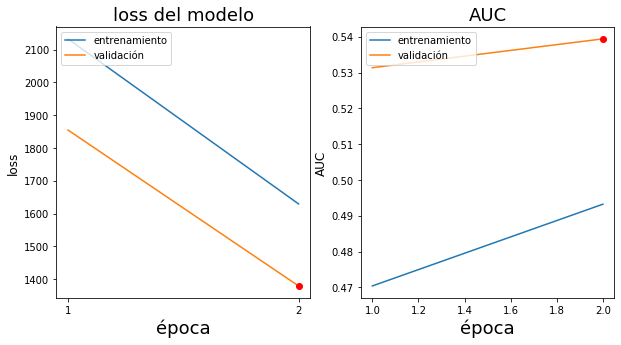

Epoch 3/1000
Learning rate = 0.00100
9/8 [================================] - 15s 2s/step - loss: 1195.1151 - acc: 0.5839 - auc: 0.4900 - val_loss: 974.8619 - val_acc: 0.8577 - val_auc: 0.5183


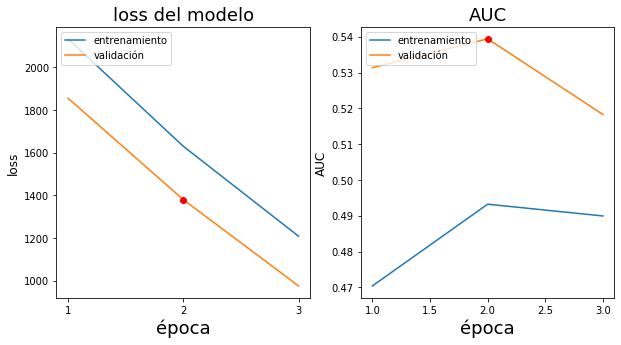

Epoch 4/1000
Learning rate = 0.00100
9/8 [================================] - 12s 1s/step - loss: 820.5880 - acc: 0.6429 - auc: 0.5365 - val_loss: 642.4284 - val_acc: 0.8577 - val_auc: 0.5138


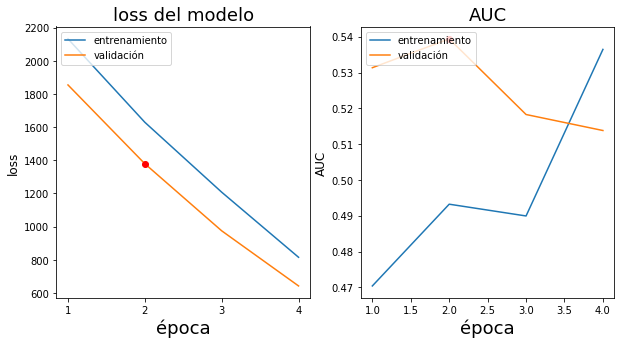

Epoch 5/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 521.6525 - acc: 0.6804 - auc: 0.5448 - val_loss: 382.7362 - val_acc: 0.8577 - val_auc: 0.5855


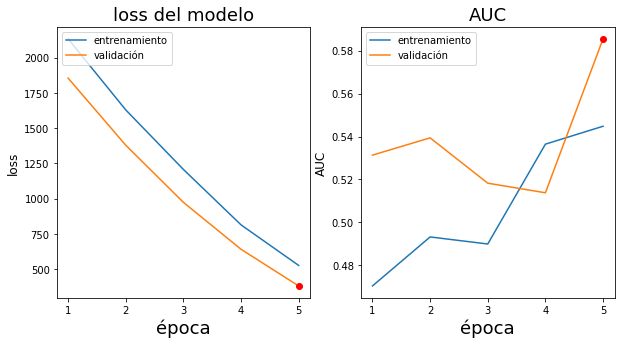

Epoch 6/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 292.8582 - acc: 0.7441 - auc: 0.6113 - val_loss: 195.9420 - val_acc: 0.8577 - val_auc: 0.7101


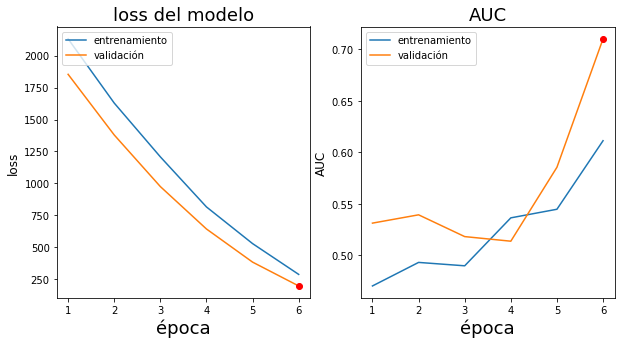

Epoch 7/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 139.9288 - acc: 0.8107 - auc: 0.6593 - val_loss: 83.4165 - val_acc: 0.8577 - val_auc: 0.5557


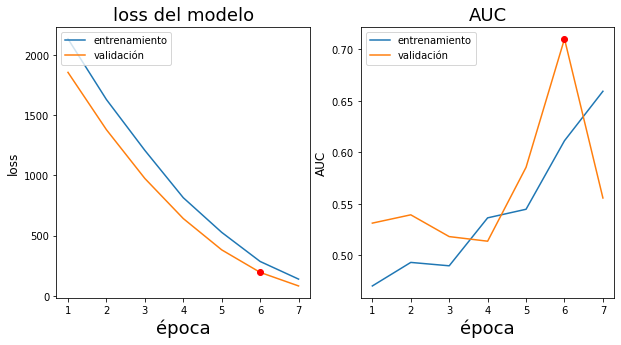

Epoch 8/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 60.1166 - acc: 0.8285 - auc: 0.6680 - val_loss: 45.2433 - val_acc: 0.8577 - val_auc: 0.6727


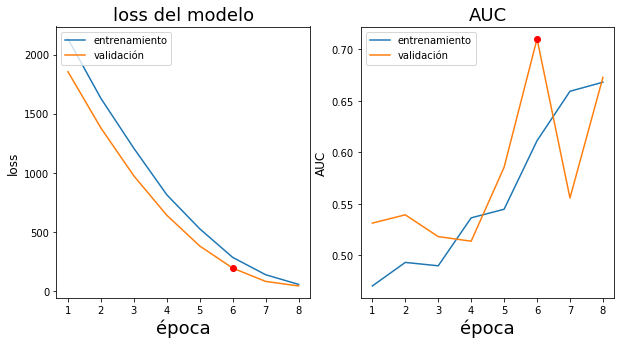

Epoch 9/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 39.7502 - acc: 0.8435 - auc: 0.6283 - val_loss: 28.7546 - val_acc: 0.8577 - val_auc: 0.5095


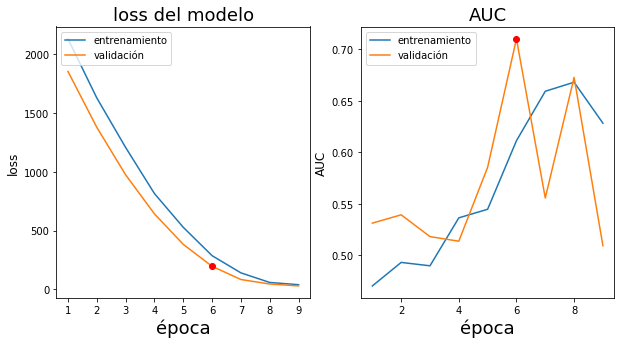

Epoch 10/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 22.7436 - acc: 0.8425 - auc: 0.6648 - val_loss: 18.9733 - val_acc: 0.8577 - val_auc: 0.5045


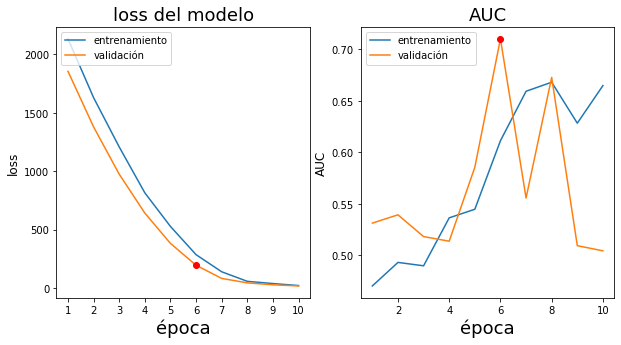

Epoch 11/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 15.8812 - acc: 0.8294 - auc: 0.6304 - val_loss: 13.3173 - val_acc: 0.8577 - val_auc: 0.5000


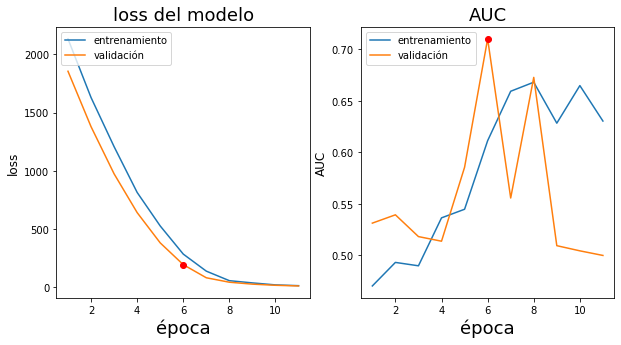

Epoch 12/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 12.0776 - acc: 0.8491 - auc: 0.6085 - val_loss: 10.8439 - val_acc: 0.8577 - val_auc: 0.5501


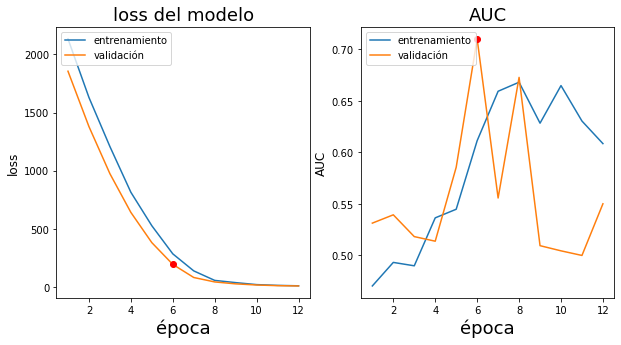

Epoch 13/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 10.2702 - acc: 0.8491 - auc: 0.6214 - val_loss: 9.6180 - val_acc: 0.8577 - val_auc: 0.5000


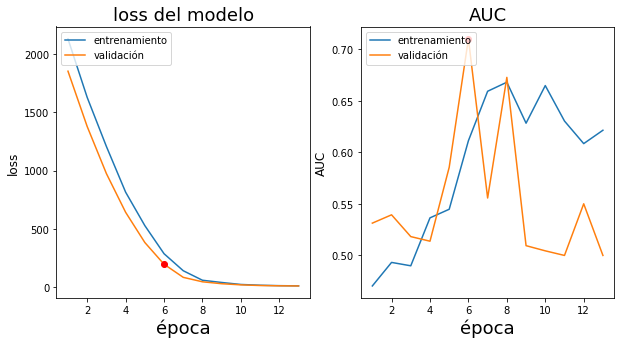

Epoch 14/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 9.3545 - acc: 0.8444 - auc: 0.6091 - val_loss: 9.1015 - val_acc: 0.8577 - val_auc: 0.5932


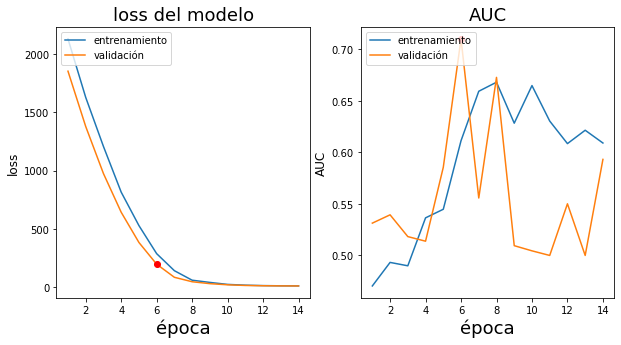

Epoch 15/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.9256 - acc: 0.8510 - auc: 0.6570 - val_loss: 8.7975 - val_acc: 0.8577 - val_auc: 0.4758


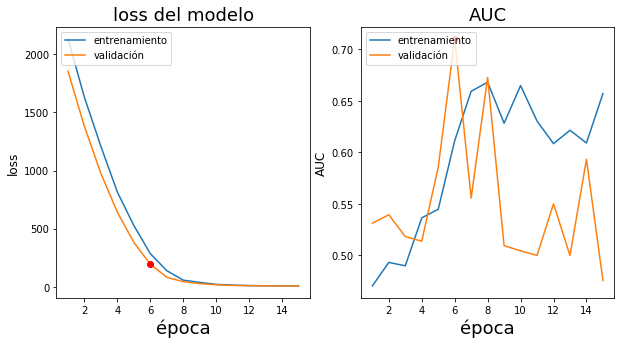

Epoch 16/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.7219 - acc: 0.8491 - auc: 0.6375 - val_loss: 8.6414 - val_acc: 0.8577 - val_auc: 0.5727


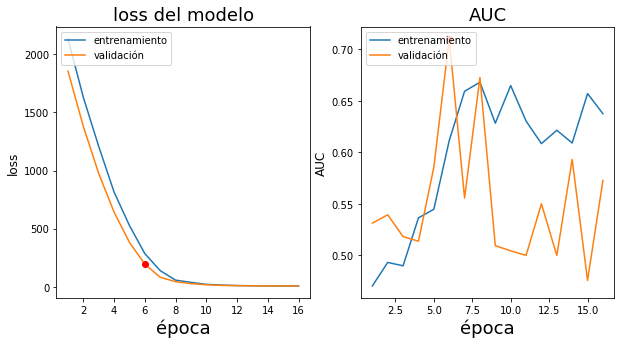

Epoch 17/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.5595 - acc: 0.8500 - auc: 0.6082 - val_loss: 8.4972 - val_acc: 0.8577 - val_auc: 0.5095


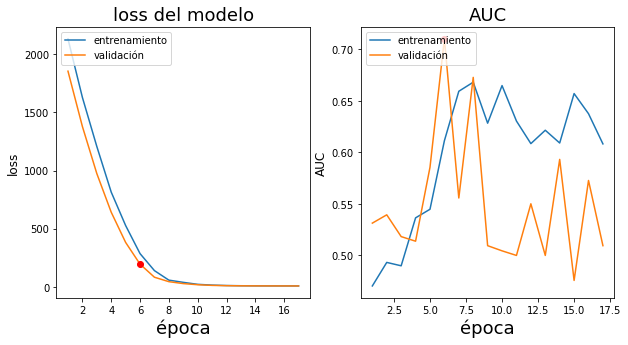

Epoch 18/1000
Learning rate = 0.00100
9/8 [================================] - 15s 2s/step - loss: 8.5593 - acc: 0.8491 - auc: 0.5595 - val_loss: 8.5359 - val_acc: 0.8577 - val_auc: 0.6038


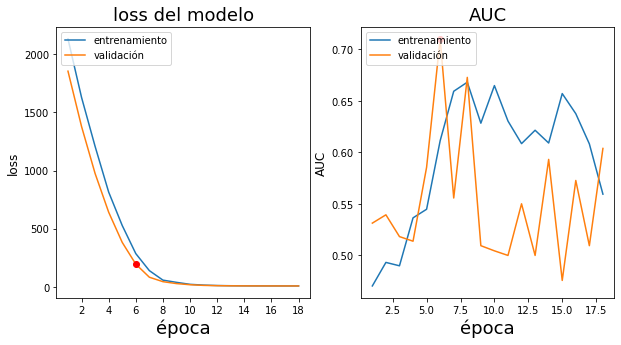

Epoch 19/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.5406 - acc: 0.8472 - auc: 0.6074 - val_loss: 8.4819 - val_acc: 0.8577 - val_auc: 0.5047


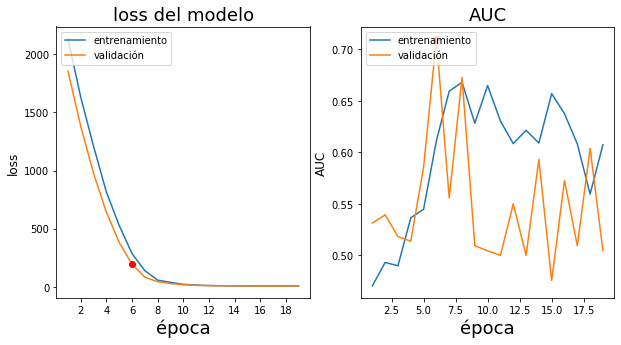

Epoch 20/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.4558 - acc: 0.8510 - auc: 0.5962 - val_loss: 8.4397 - val_acc: 0.8577 - val_auc: 0.5988


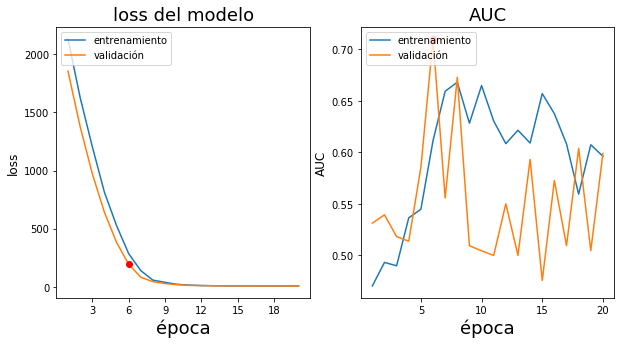

Epoch 21/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.4022 - acc: 0.8491 - auc: 0.6554 - val_loss: 8.4132 - val_acc: 0.8577 - val_auc: 0.4905


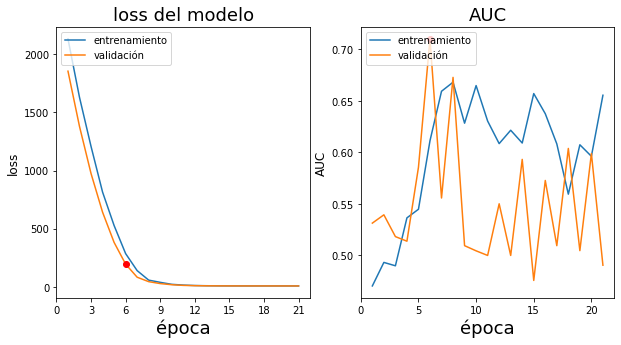

Epoch 22/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.4013 - acc: 0.8510 - auc: 0.6259 - val_loss: 8.4085 - val_acc: 0.8577 - val_auc: 0.4954


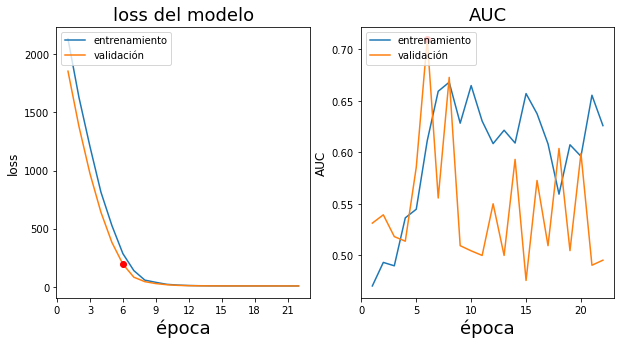

Epoch 23/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.3938 - acc: 0.8463 - auc: 0.6057 - val_loss: 8.3611 - val_acc: 0.8577 - val_auc: 0.6198


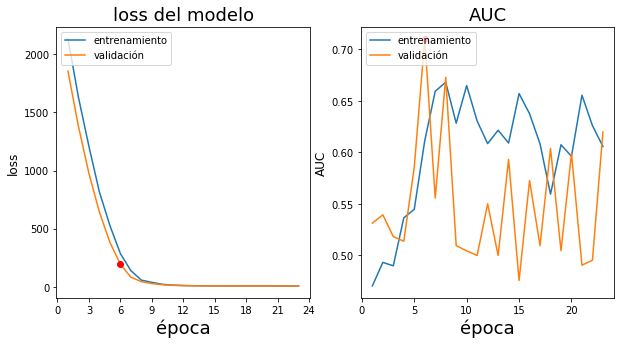

Epoch 24/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.3538 - acc: 0.8510 - auc: 0.6400 - val_loss: 8.4091 - val_acc: 0.8577 - val_auc: 0.6872


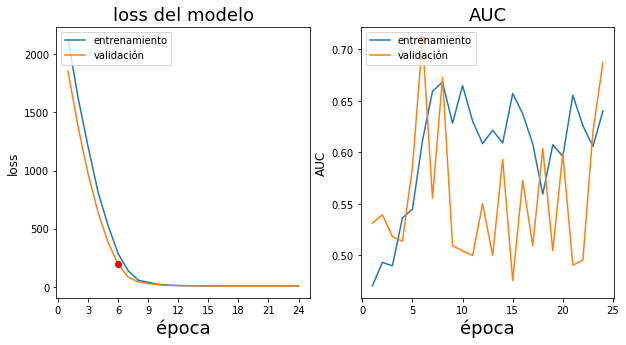

Epoch 25/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.3797 - acc: 0.8500 - auc: 0.6280 - val_loss: 8.3654 - val_acc: 0.8577 - val_auc: 0.5301


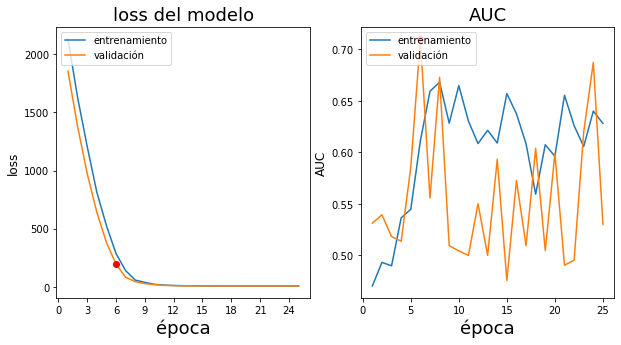

Epoch 26/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.4043 - acc: 0.8491 - auc: 0.6026 - val_loss: 8.3701 - val_acc: 0.8577 - val_auc: 0.4953


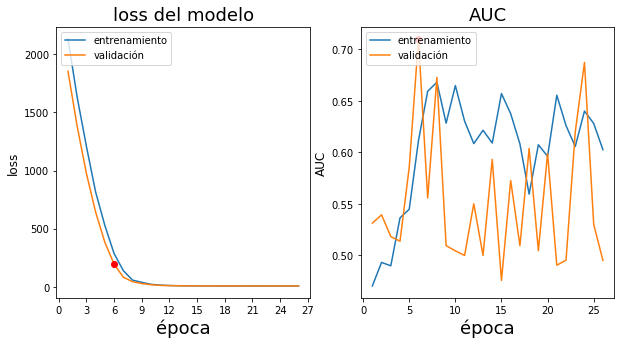

Epoch 27/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.3712 - acc: 0.8510 - auc: 0.5935 - val_loss: 8.3670 - val_acc: 0.8577 - val_auc: 0.4766


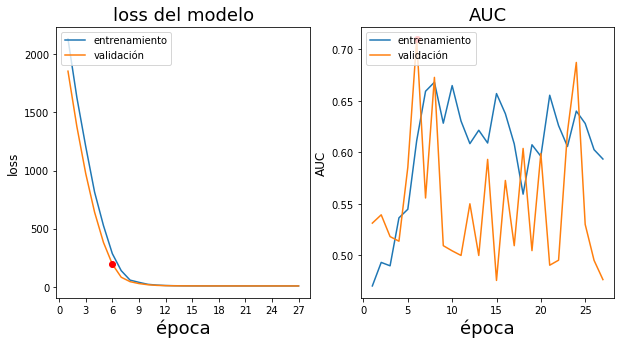

Epoch 28/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.3639 - acc: 0.8491 - auc: 0.6353 - val_loss: 8.3408 - val_acc: 0.8577 - val_auc: 0.5290


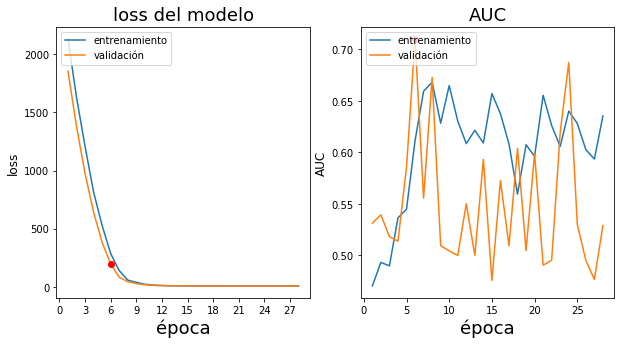

Epoch 29/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.3170 - acc: 0.8500 - auc: 0.6041 - val_loss: 8.2928 - val_acc: 0.8577 - val_auc: 0.4834


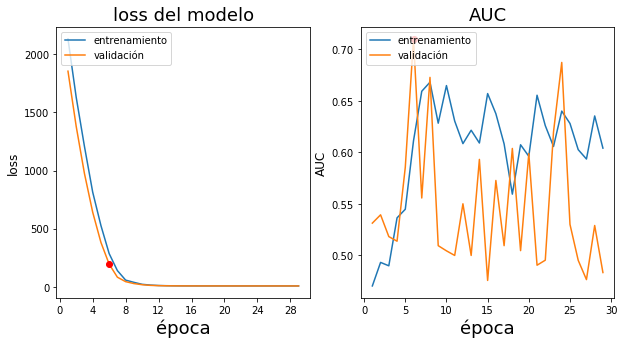

Epoch 30/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.3315 - acc: 0.8510 - auc: 0.6306 - val_loss: 8.3312 - val_acc: 0.8577 - val_auc: 0.6221


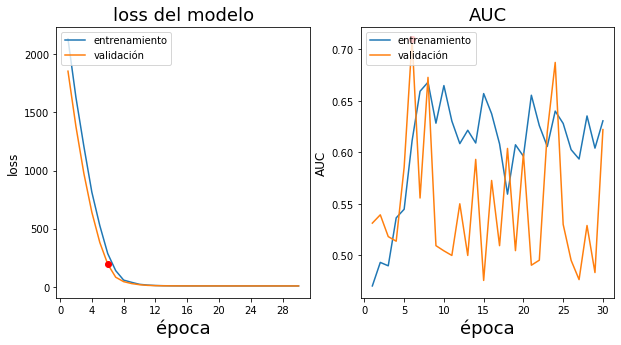

Epoch 31/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.2654 - acc: 0.8500 - auc: 0.6553 - val_loss: 8.2878 - val_acc: 0.8577 - val_auc: 0.5593


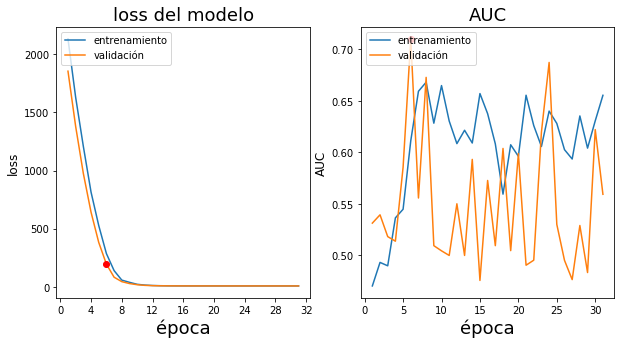

Epoch 32/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.2545 - acc: 0.8510 - auc: 0.6086 - val_loss: 8.2441 - val_acc: 0.8577 - val_auc: 0.5598


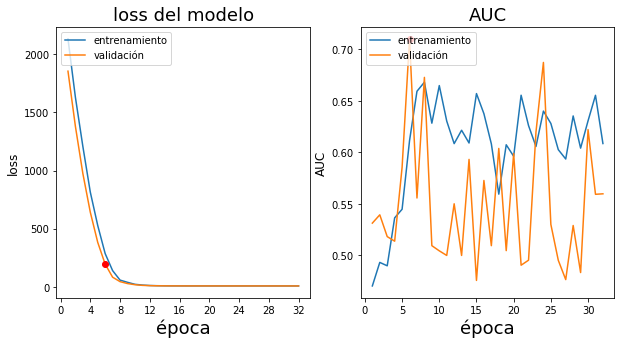

Epoch 33/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.2122 - acc: 0.8519 - auc: 0.6465 - val_loss: 8.1843 - val_acc: 0.8577 - val_auc: 0.4753


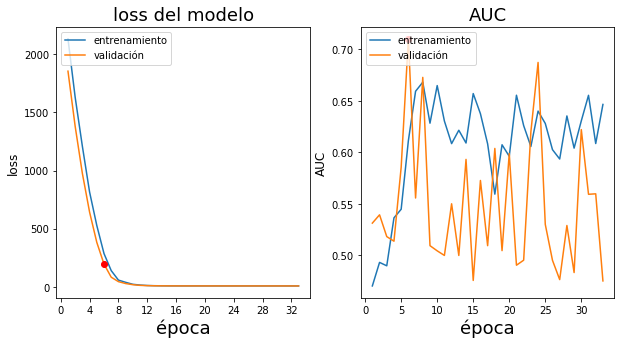

Epoch 34/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.2457 - acc: 0.8510 - auc: 0.6083 - val_loss: 8.2734 - val_acc: 0.8577 - val_auc: 0.6544


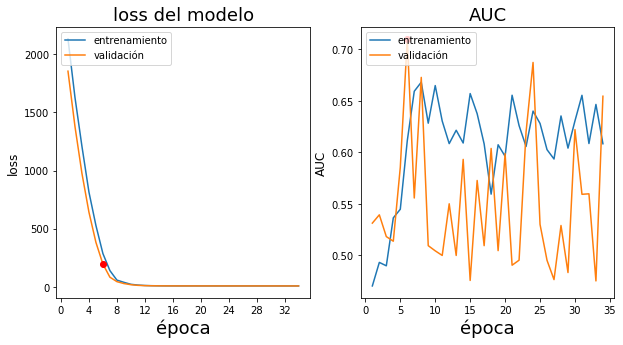

Epoch 35/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.2558 - acc: 0.8510 - auc: 0.6340 - val_loss: 8.2343 - val_acc: 0.8577 - val_auc: 0.5007


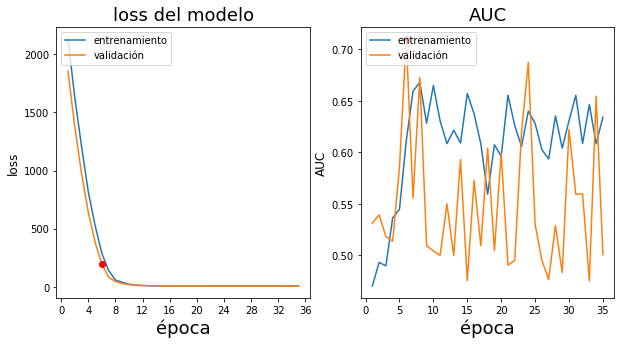

Epoch 36/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.2898 - acc: 0.8482 - auc: 0.5342 - val_loss: 8.2775 - val_acc: 0.8577 - val_auc: 0.5050


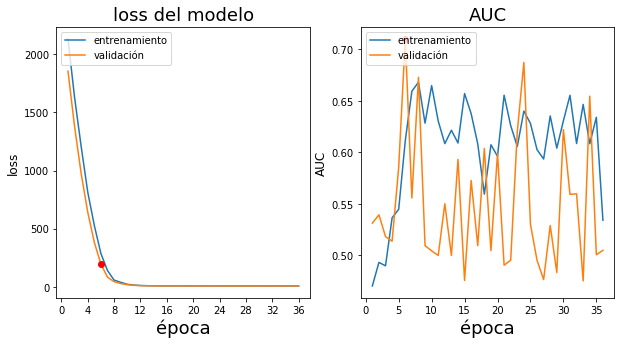

Epoch 37/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.2803 - acc: 0.8529 - auc: 0.6091 - val_loss: 8.3093 - val_acc: 0.8577 - val_auc: 0.6250


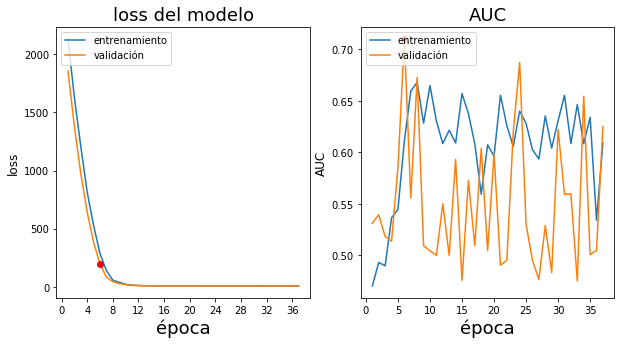

Epoch 38/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.2509 - acc: 0.8519 - auc: 0.6093 - val_loss: 8.2518 - val_acc: 0.8577 - val_auc: 0.6983


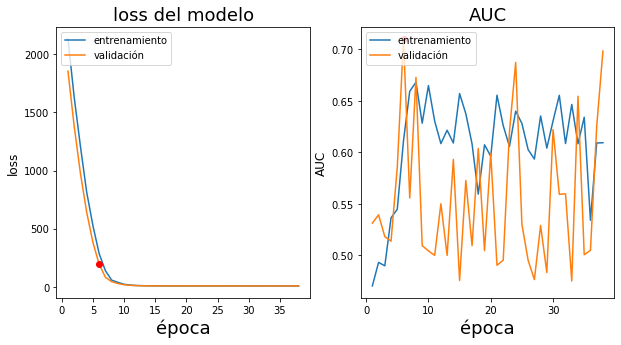

Epoch 39/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.2070 - acc: 0.8510 - auc: 0.6494 - val_loss: 8.2012 - val_acc: 0.8577 - val_auc: 0.5749


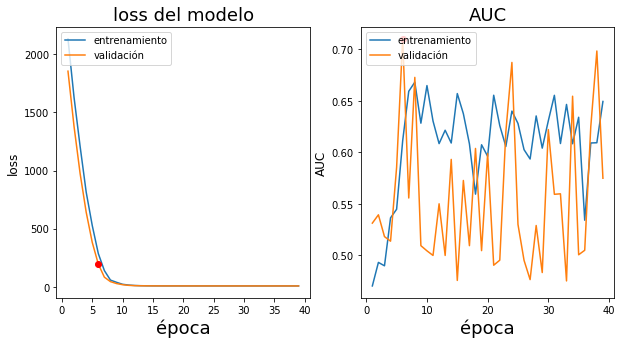

Epoch 40/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1727 - acc: 0.8510 - auc: 0.6834 - val_loss: 8.2139 - val_acc: 0.8577 - val_auc: 0.4693


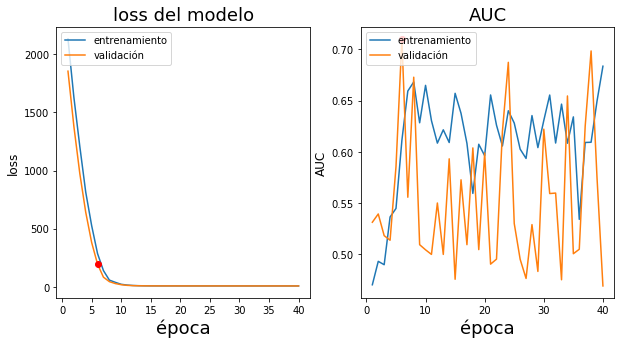

Epoch 41/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.2071 - acc: 0.8500 - auc: 0.6622 - val_loss: 8.2030 - val_acc: 0.8577 - val_auc: 0.5208


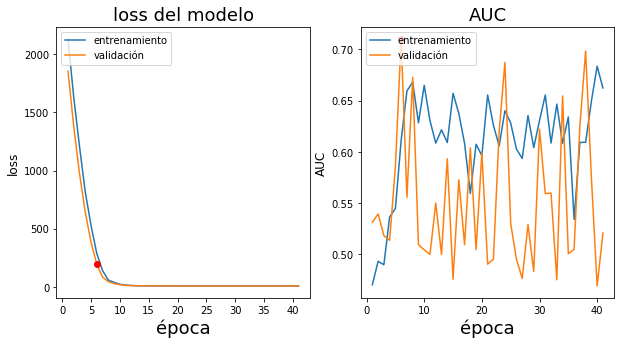

Epoch 42/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1957 - acc: 0.8482 - auc: 0.6059 - val_loss: 8.1983 - val_acc: 0.8577 - val_auc: 0.5559


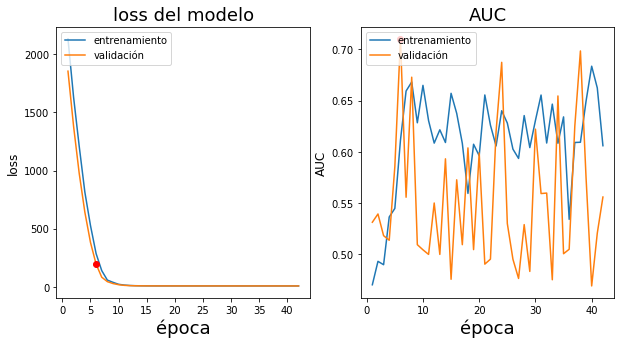

Epoch 43/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.2038 - acc: 0.8519 - auc: 0.6593 - val_loss: 8.1778 - val_acc: 0.8577 - val_auc: 0.6741


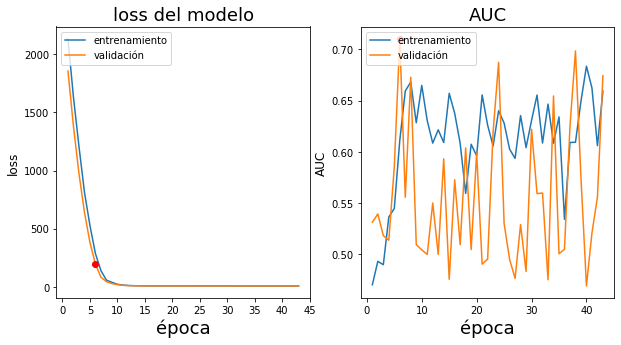

Epoch 44/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1820 - acc: 0.8510 - auc: 0.6758 - val_loss: 8.1600 - val_acc: 0.8577 - val_auc: 0.3447


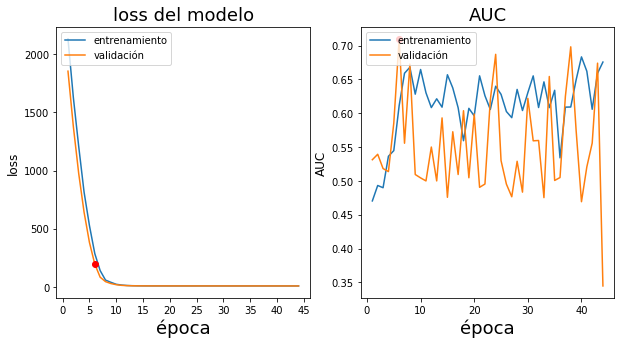

Epoch 45/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.2073 - acc: 0.8500 - auc: 0.6359 - val_loss: 8.1984 - val_acc: 0.8577 - val_auc: 0.6881


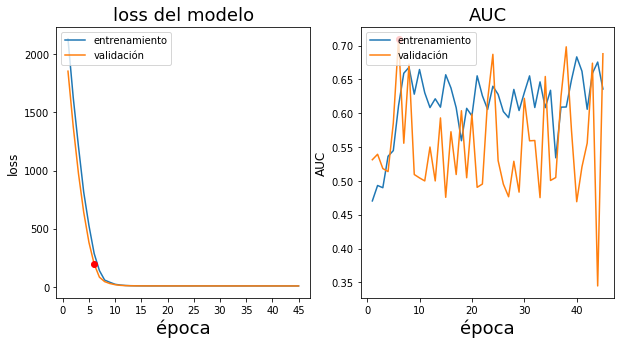

Epoch 46/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1846 - acc: 0.8510 - auc: 0.6429 - val_loss: 8.2349 - val_acc: 0.8577 - val_auc: 0.5586


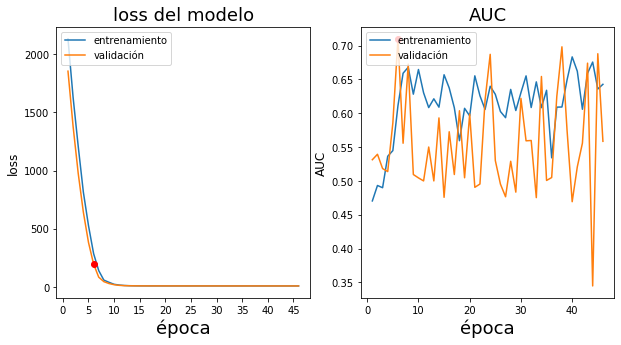

Epoch 47/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1821 - acc: 0.8510 - auc: 0.6118 - val_loss: 8.2132 - val_acc: 0.8577 - val_auc: 0.6817


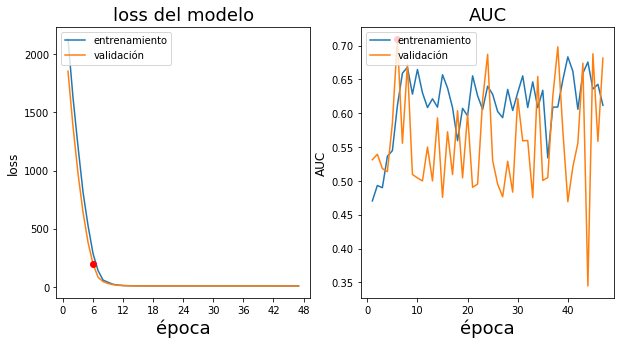

Epoch 48/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1844 - acc: 0.8510 - auc: 0.6349 - val_loss: 8.1454 - val_acc: 0.8577 - val_auc: 0.5957


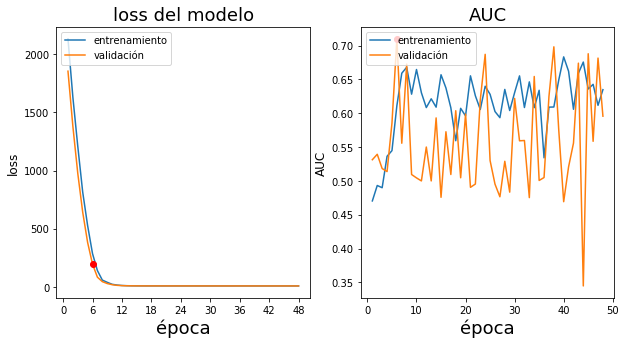

Epoch 49/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1494 - acc: 0.8519 - auc: 0.6598 - val_loss: 8.1634 - val_acc: 0.8577 - val_auc: 0.6634


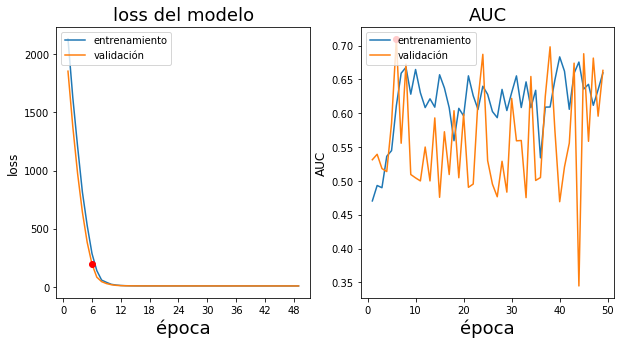

Epoch 50/1000
Learning rate = 0.00100
9/8 [================================] - 15s 2s/step - loss: 8.1923 - acc: 0.8510 - auc: 0.6157 - val_loss: 8.1798 - val_acc: 0.8577 - val_auc: 0.5362


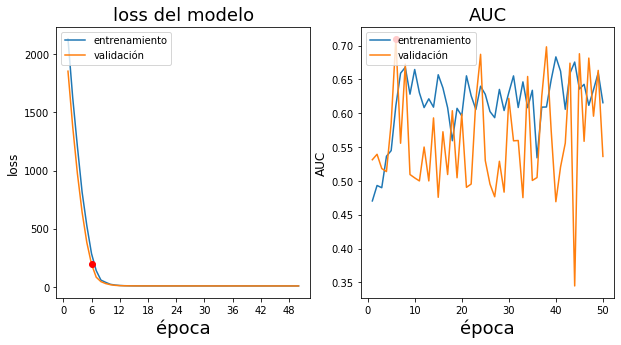

Epoch 51/1000
Learning rate = 0.00100
9/8 [================================] - 15s 2s/step - loss: 8.1676 - acc: 0.8510 - auc: 0.6628 - val_loss: 8.1494 - val_acc: 0.8577 - val_auc: 0.6538


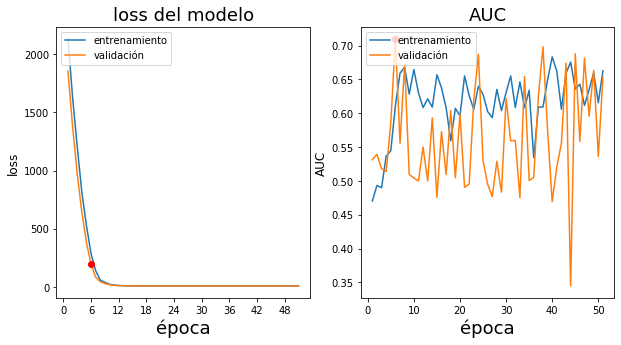

Epoch 52/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1647 - acc: 0.8500 - auc: 0.6352 - val_loss: 8.2180 - val_acc: 0.8577 - val_auc: 0.6049


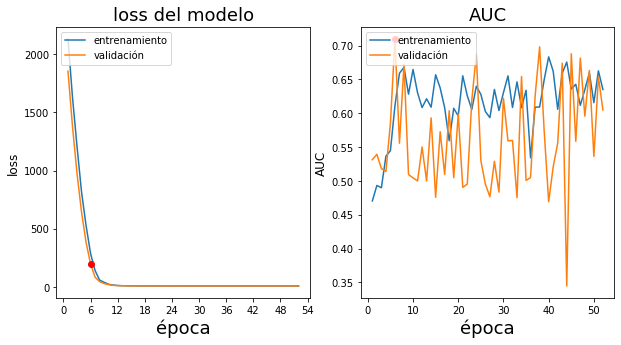

Epoch 53/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1986 - acc: 0.8510 - auc: 0.6468 - val_loss: 8.2011 - val_acc: 0.8577 - val_auc: 0.6485


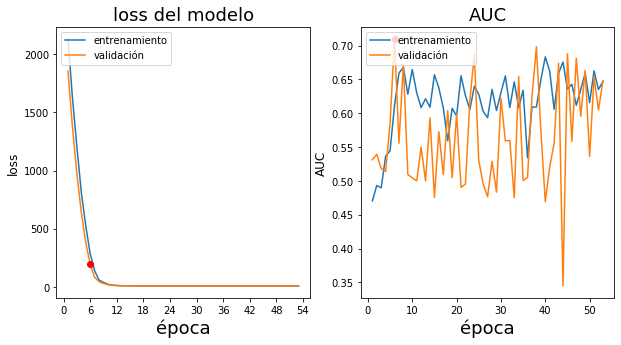

Epoch 54/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1805 - acc: 0.8491 - auc: 0.6460 - val_loss: 8.2351 - val_acc: 0.8577 - val_auc: 0.6360


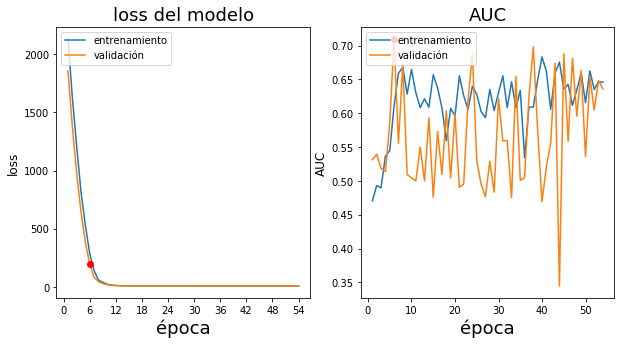

Epoch 55/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1995 - acc: 0.8500 - auc: 0.6802 - val_loss: 8.2088 - val_acc: 0.8577 - val_auc: 0.5783


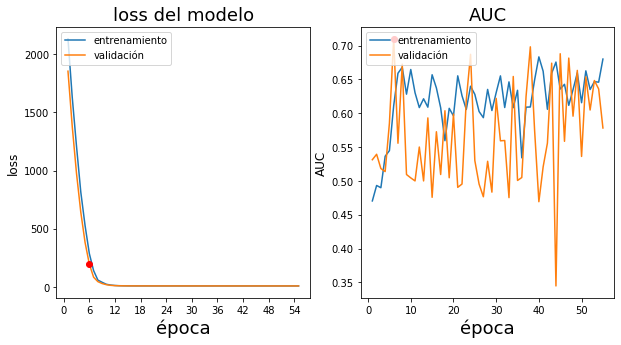

Epoch 56/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1937 - acc: 0.8491 - auc: 0.6706 - val_loss: 8.1935 - val_acc: 0.8577 - val_auc: 0.6400


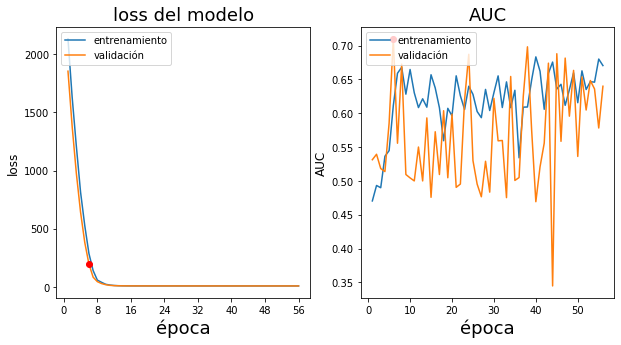

Epoch 57/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1582 - acc: 0.8510 - auc: 0.6678 - val_loss: 8.1589 - val_acc: 0.8577 - val_auc: 0.6018


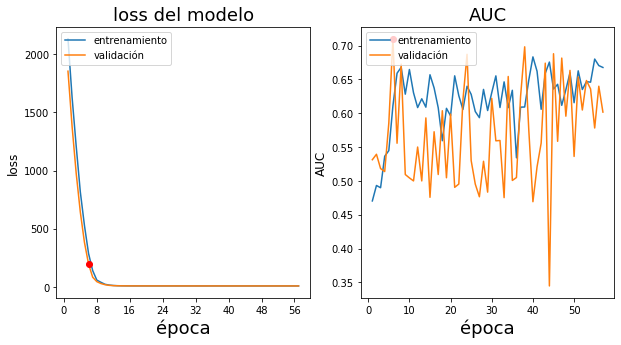

Epoch 58/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1579 - acc: 0.8529 - auc: 0.6480 - val_loss: 8.1670 - val_acc: 0.8577 - val_auc: 0.7338


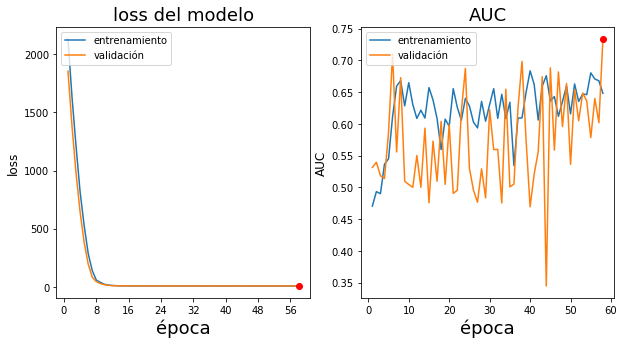

Epoch 59/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1573 - acc: 0.8500 - auc: 0.6589 - val_loss: 8.1508 - val_acc: 0.8577 - val_auc: 0.6652


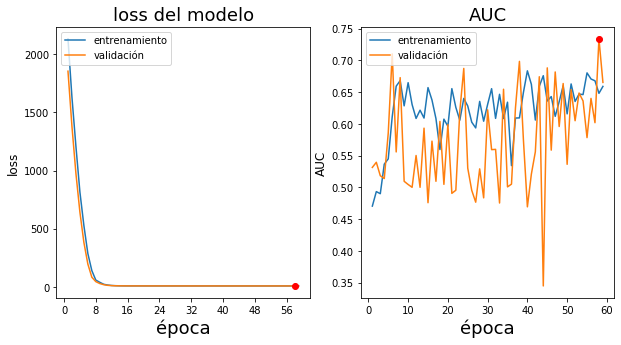

Epoch 60/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1771 - acc: 0.8510 - auc: 0.6619 - val_loss: 8.1638 - val_acc: 0.8577 - val_auc: 0.7083


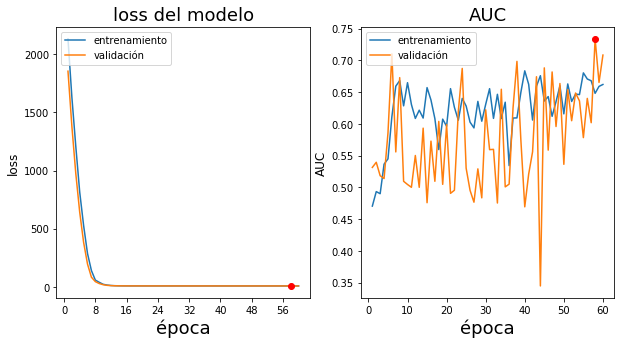

Epoch 61/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1612 - acc: 0.8529 - auc: 0.6864 - val_loss: 8.1754 - val_acc: 0.8577 - val_auc: 0.5611


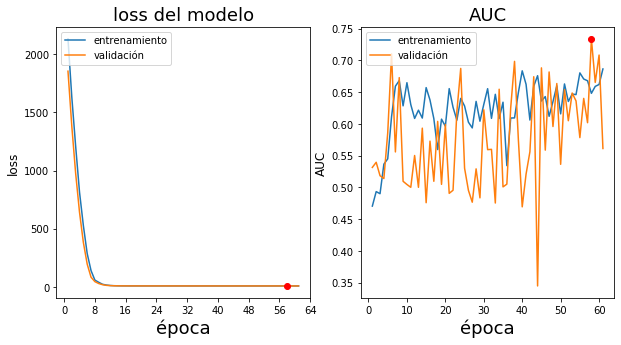

Epoch 62/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1891 - acc: 0.8500 - auc: 0.6408 - val_loss: 8.2001 - val_acc: 0.8577 - val_auc: 0.7605


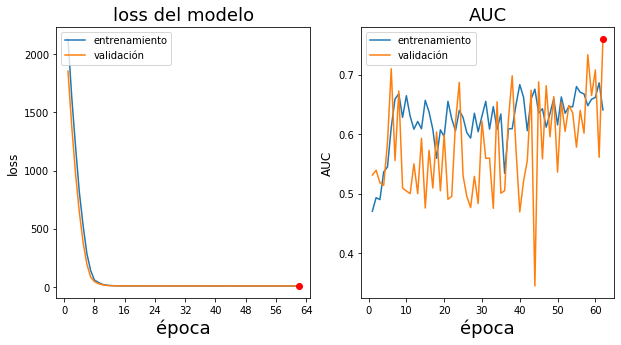

Epoch 63/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1592 - acc: 0.8510 - auc: 0.6554 - val_loss: 8.1418 - val_acc: 0.8577 - val_auc: 0.6445


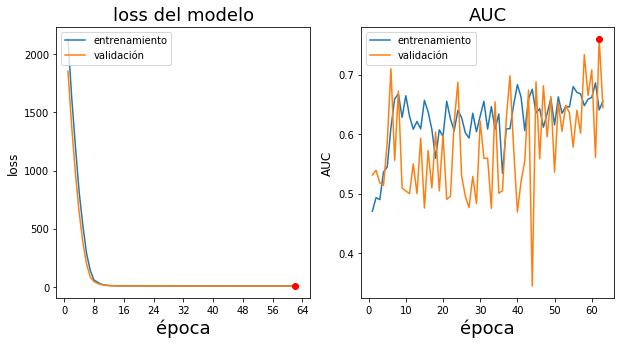

Epoch 64/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1595 - acc: 0.8510 - auc: 0.6268 - val_loss: 8.1428 - val_acc: 0.8577 - val_auc: 0.7395


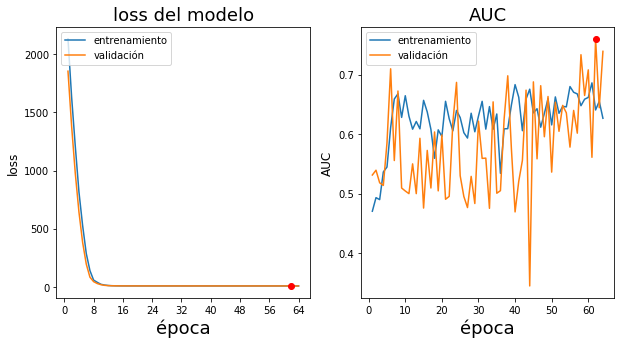

Epoch 65/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1741 - acc: 0.8510 - auc: 0.6126 - val_loss: 8.2002 - val_acc: 0.8577 - val_auc: 0.6950


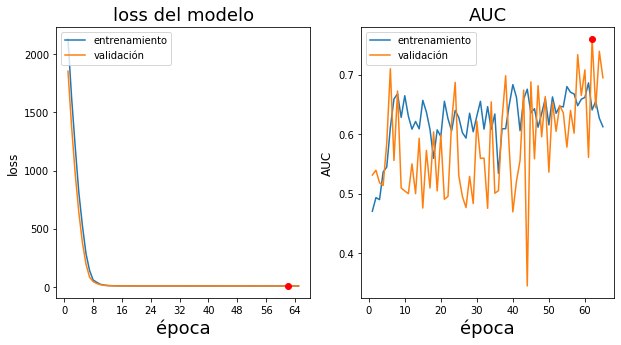

Epoch 66/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1869 - acc: 0.8510 - auc: 0.6477 - val_loss: 8.1728 - val_acc: 0.8577 - val_auc: 0.7258


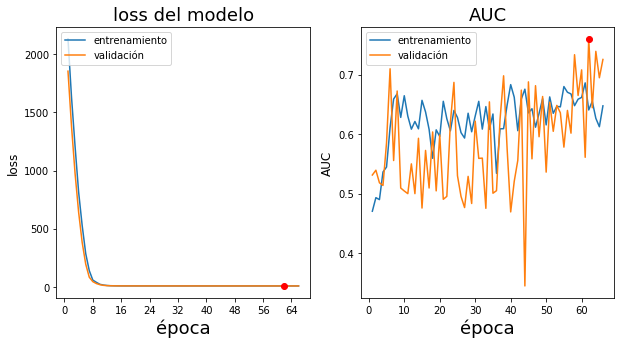

Epoch 67/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1347 - acc: 0.8529 - auc: 0.6829 - val_loss: 8.1537 - val_acc: 0.8577 - val_auc: 0.6684


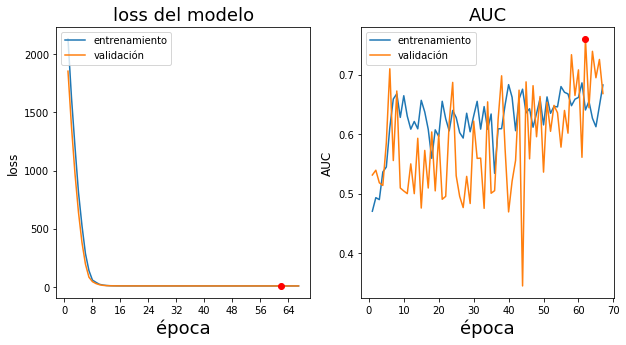

Epoch 68/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1603 - acc: 0.8519 - auc: 0.6704 - val_loss: 8.1632 - val_acc: 0.8577 - val_auc: 0.5978


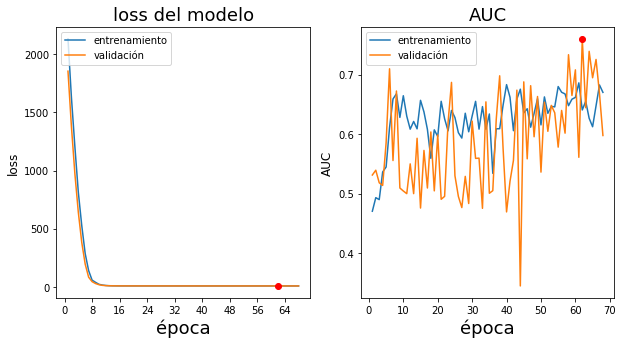

Epoch 69/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1578 - acc: 0.8510 - auc: 0.6436 - val_loss: 8.1438 - val_acc: 0.8577 - val_auc: 0.6412


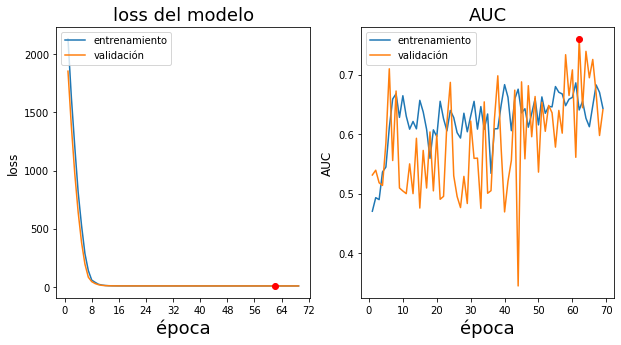

Epoch 70/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1509 - acc: 0.8510 - auc: 0.6745 - val_loss: 8.1636 - val_acc: 0.8577 - val_auc: 0.4695


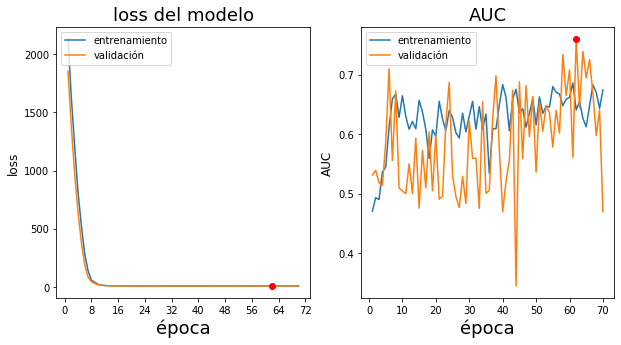

Epoch 71/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.1374 - acc: 0.8519 - auc: 0.6717 - val_loss: 8.1454 - val_acc: 0.8577 - val_auc: 0.5592


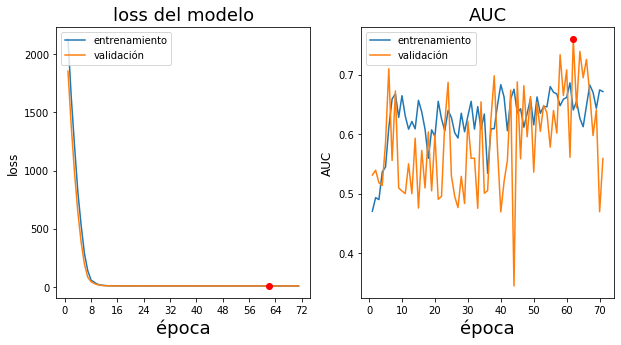

Epoch 72/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1297 - acc: 0.8491 - auc: 0.6633 - val_loss: 8.1532 - val_acc: 0.8577 - val_auc: 0.5246


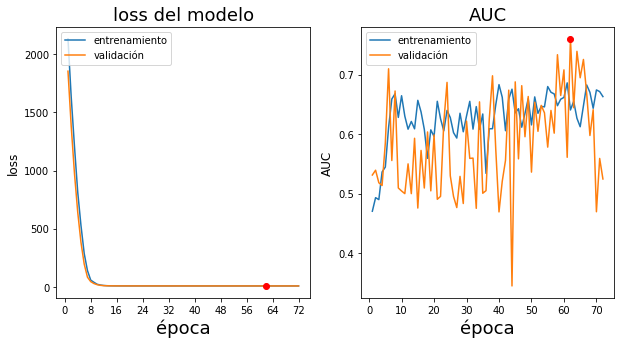

Epoch 73/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.1131 - acc: 0.8519 - auc: 0.6486 - val_loss: 8.0449 - val_acc: 0.8577 - val_auc: 0.6370


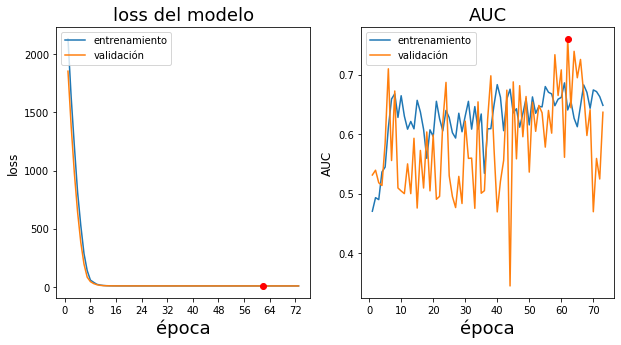

Epoch 74/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0614 - acc: 0.8510 - auc: 0.6668 - val_loss: 8.0946 - val_acc: 0.8577 - val_auc: 0.5413


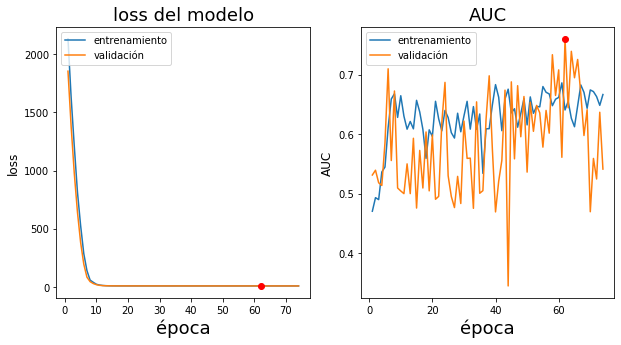

Epoch 75/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0640 - acc: 0.8529 - auc: 0.6867 - val_loss: 8.0829 - val_acc: 0.8577 - val_auc: 0.6471


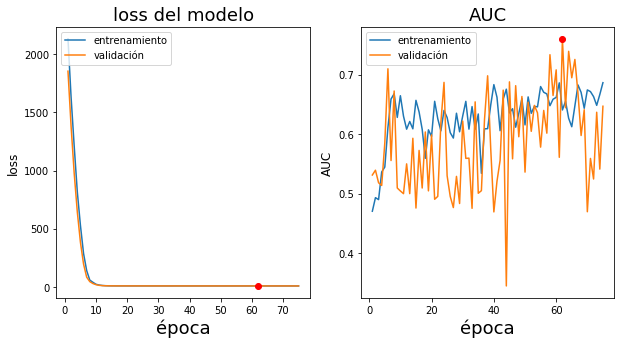

Epoch 76/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0528 - acc: 0.8510 - auc: 0.6729 - val_loss: 8.1119 - val_acc: 0.8577 - val_auc: 0.6590


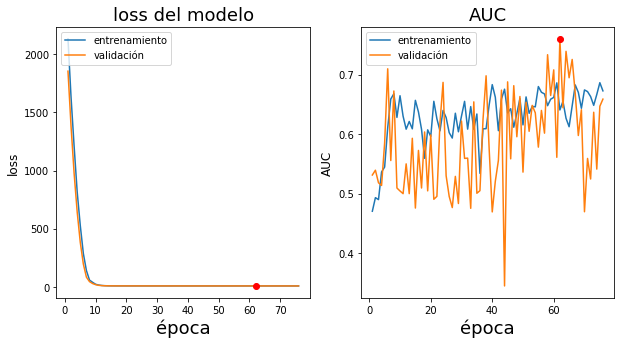

Epoch 77/1000
Learning rate = 0.00100
9/8 [================================] - 15s 2s/step - loss: 8.0867 - acc: 0.8510 - auc: 0.6699 - val_loss: 8.1164 - val_acc: 0.8577 - val_auc: 0.6195


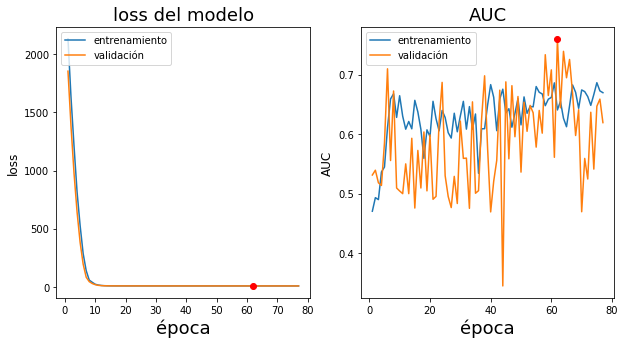

Epoch 78/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0659 - acc: 0.8519 - auc: 0.6980 - val_loss: 8.1071 - val_acc: 0.8577 - val_auc: 0.6290


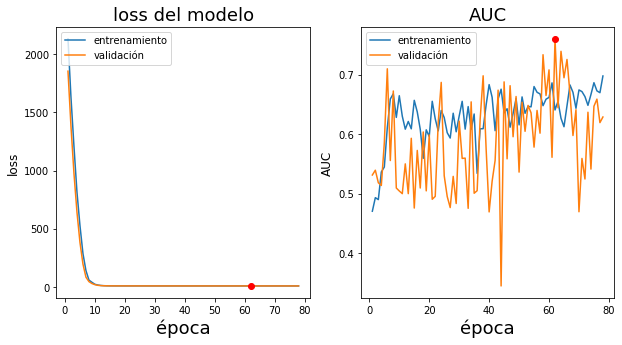

Epoch 79/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0825 - acc: 0.8519 - auc: 0.6742 - val_loss: 8.0893 - val_acc: 0.8577 - val_auc: 0.7073


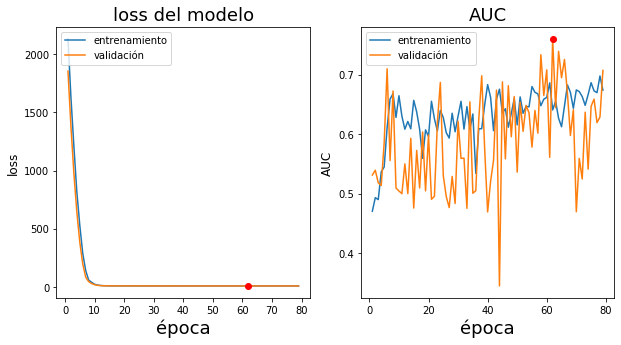

Epoch 80/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0612 - acc: 0.8500 - auc: 0.6736 - val_loss: 8.0726 - val_acc: 0.8577 - val_auc: 0.6173


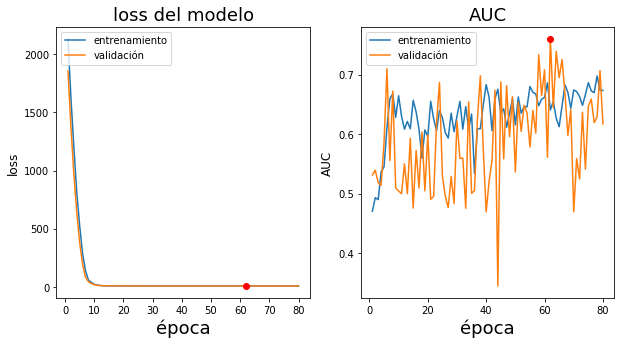

Epoch 81/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0908 - acc: 0.8547 - auc: 0.6951 - val_loss: 8.0901 - val_acc: 0.8577 - val_auc: 0.5193


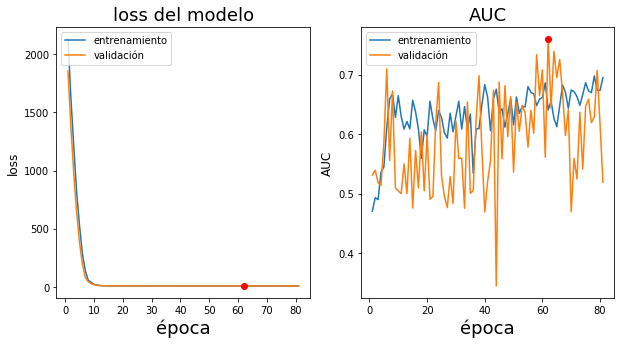

Epoch 82/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0538 - acc: 0.8500 - auc: 0.6889 - val_loss: 8.0680 - val_acc: 0.8577 - val_auc: 0.7032


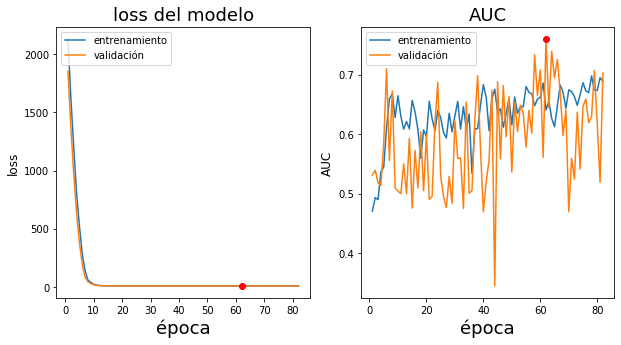

Epoch 83/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0529 - acc: 0.8529 - auc: 0.6838 - val_loss: 8.0389 - val_acc: 0.8577 - val_auc: 0.7422


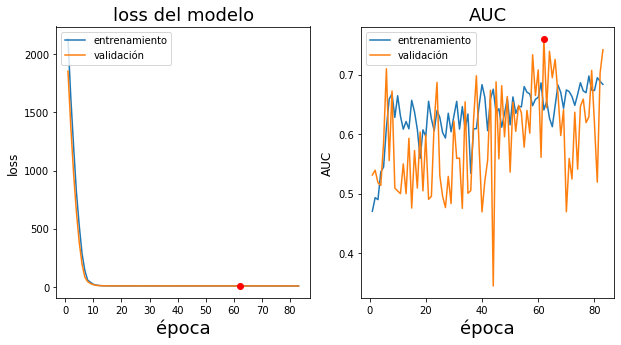

Epoch 84/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0727 - acc: 0.8575 - auc: 0.6969 - val_loss: 8.0850 - val_acc: 0.8577 - val_auc: 0.6219


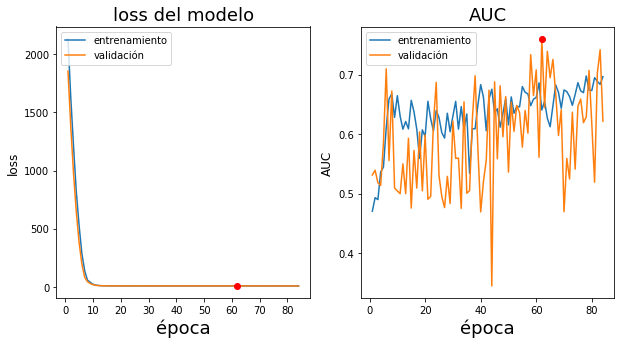

Epoch 85/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0655 - acc: 0.8538 - auc: 0.7227 - val_loss: 8.0711 - val_acc: 0.8577 - val_auc: 0.6649


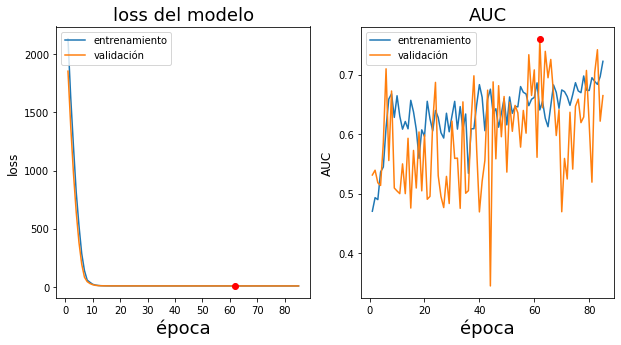

Epoch 86/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0317 - acc: 0.8500 - auc: 0.7198 - val_loss: 8.0944 - val_acc: 0.8577 - val_auc: 0.5768


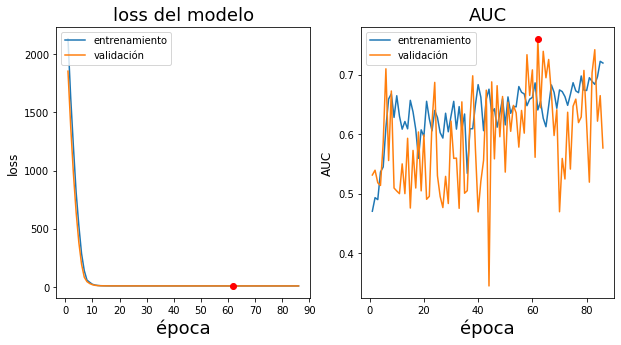

Epoch 87/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0462 - acc: 0.8510 - auc: 0.7220 - val_loss: 8.0607 - val_acc: 0.8577 - val_auc: 0.6908


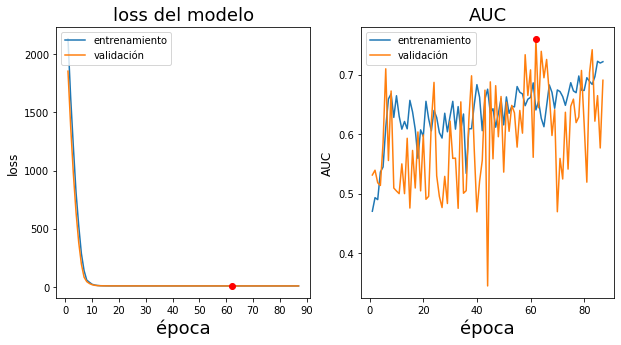

Epoch 88/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0576 - acc: 0.8500 - auc: 0.6821 - val_loss: 8.0266 - val_acc: 0.8577 - val_auc: 0.6195


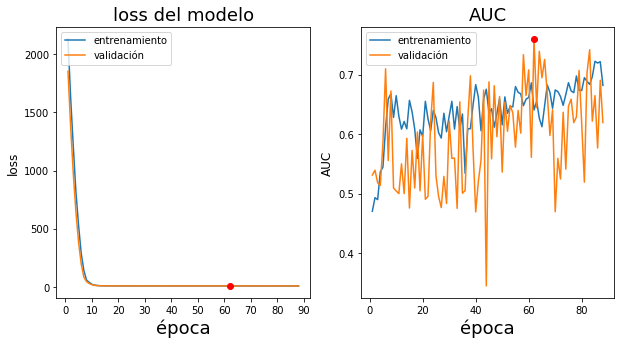

Epoch 89/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0257 - acc: 0.8566 - auc: 0.7035 - val_loss: 8.0145 - val_acc: 0.8577 - val_auc: 0.6622


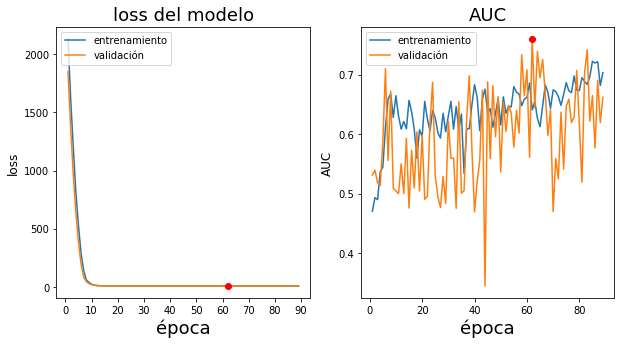

Epoch 90/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0202 - acc: 0.8510 - auc: 0.7280 - val_loss: 8.0602 - val_acc: 0.8577 - val_auc: 0.6714


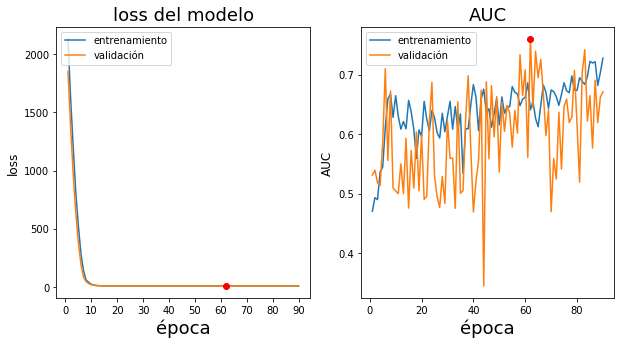

Epoch 91/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0090 - acc: 0.8529 - auc: 0.7342 - val_loss: 8.0194 - val_acc: 0.8577 - val_auc: 0.6383


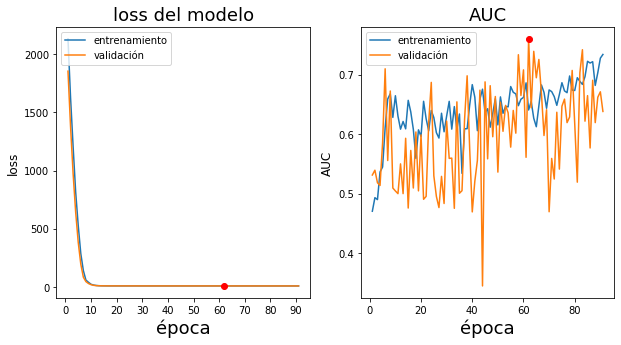

Epoch 92/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0093 - acc: 0.8547 - auc: 0.7057 - val_loss: 8.0431 - val_acc: 0.8577 - val_auc: 0.6408


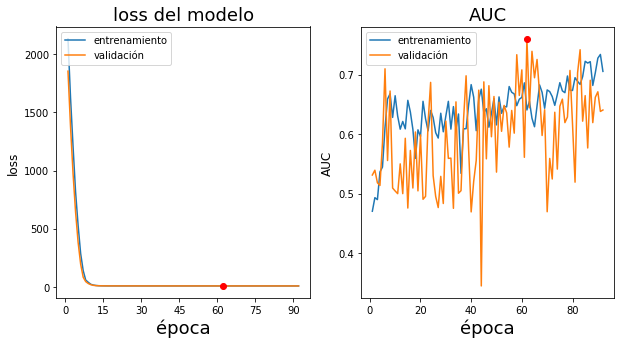

Epoch 93/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 8.0174 - acc: 0.8519 - auc: 0.6912 - val_loss: 8.0016 - val_acc: 0.8577 - val_auc: 0.7265


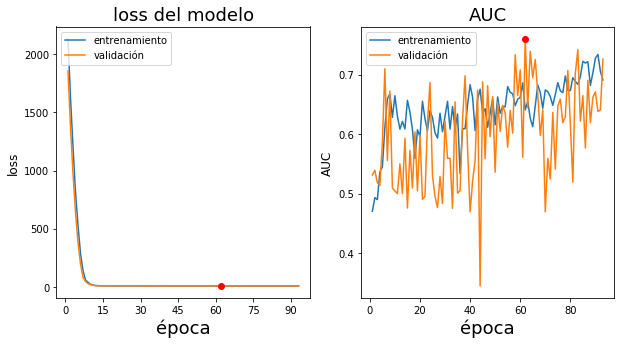

Epoch 94/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9773 - acc: 0.8547 - auc: 0.7071 - val_loss: 8.0186 - val_acc: 0.8577 - val_auc: 0.6339


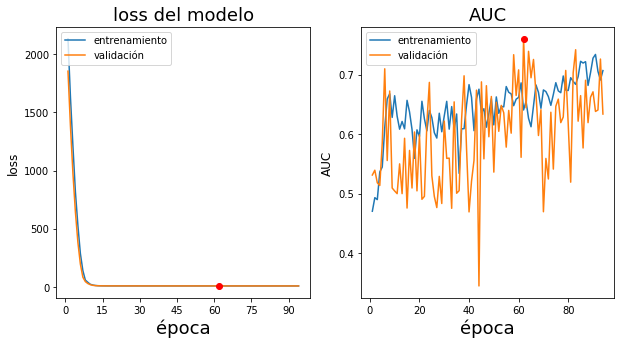

Epoch 95/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9673 - acc: 0.8547 - auc: 0.7404 - val_loss: 8.0407 - val_acc: 0.8577 - val_auc: 0.6595


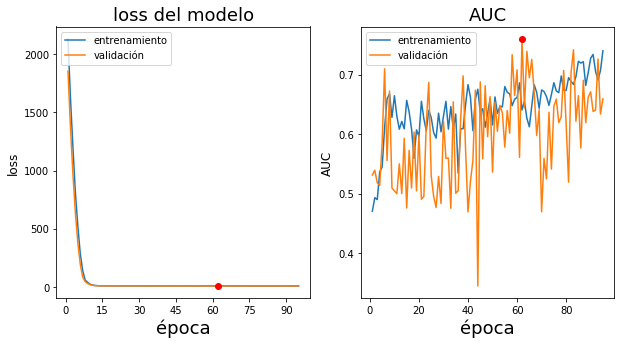

Epoch 96/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0184 - acc: 0.8538 - auc: 0.7308 - val_loss: 8.0599 - val_acc: 0.8577 - val_auc: 0.5425


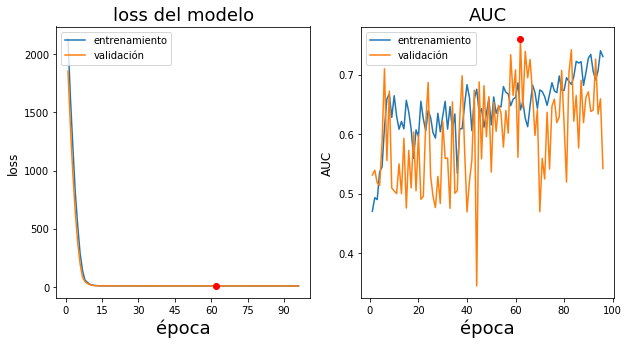

Epoch 97/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9997 - acc: 0.8547 - auc: 0.7318 - val_loss: 8.0091 - val_acc: 0.8577 - val_auc: 0.6796


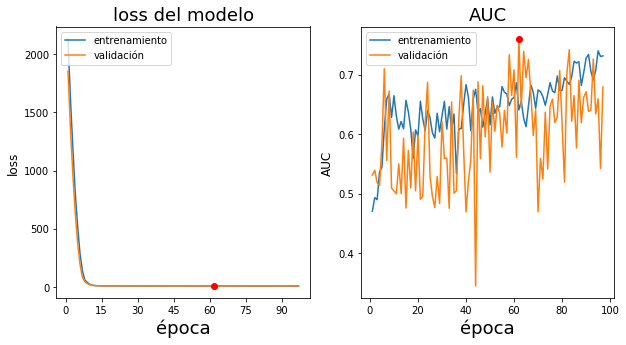

Epoch 98/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9995 - acc: 0.8529 - auc: 0.6894 - val_loss: 8.0089 - val_acc: 0.8577 - val_auc: 0.6930


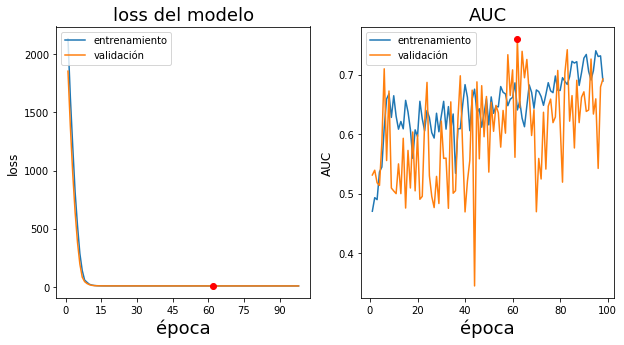

Epoch 99/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0011 - acc: 0.8529 - auc: 0.7203 - val_loss: 8.0231 - val_acc: 0.8577 - val_auc: 0.6172


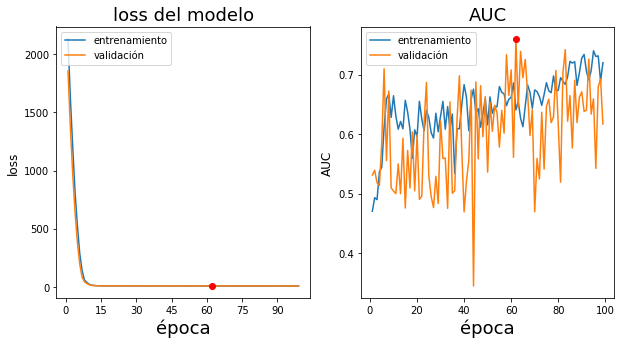

Epoch 100/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9987 - acc: 0.8529 - auc: 0.6998 - val_loss: 7.9828 - val_acc: 0.8577 - val_auc: 0.6957


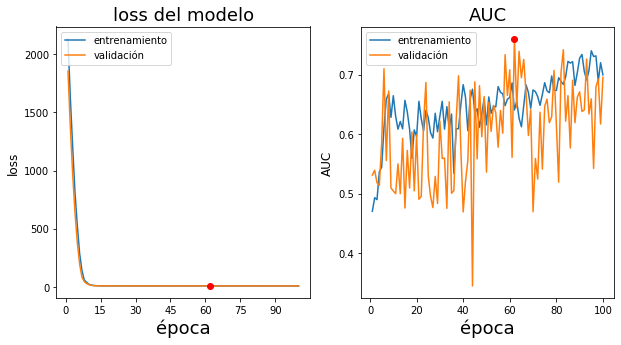

Epoch 101/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9563 - acc: 0.8575 - auc: 0.7074 - val_loss: 7.9696 - val_acc: 0.8577 - val_auc: 0.6424


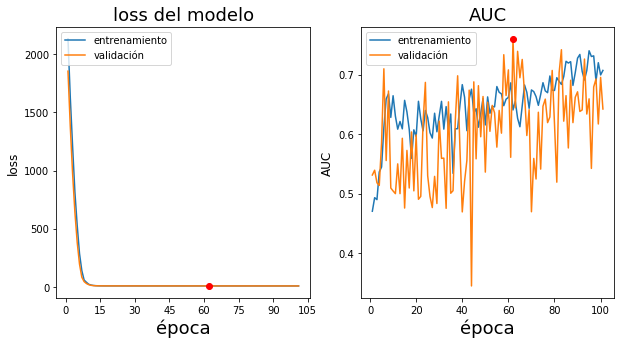

Epoch 102/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9735 - acc: 0.8557 - auc: 0.7088 - val_loss: 8.0588 - val_acc: 0.8577 - val_auc: 0.6145


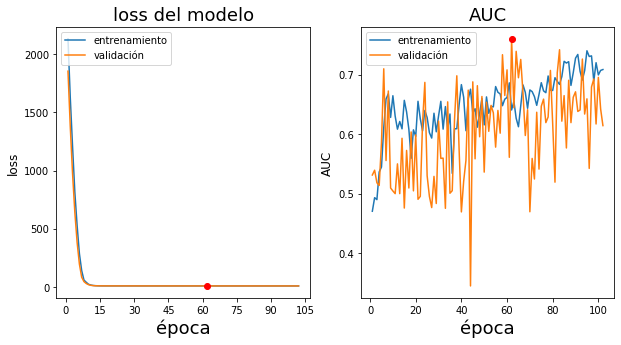

Epoch 103/1000
Learning rate = 0.00100
9/8 [================================] - 15s 2s/step - loss: 7.9837 - acc: 0.8529 - auc: 0.6988 - val_loss: 7.9730 - val_acc: 0.8577 - val_auc: 0.7020


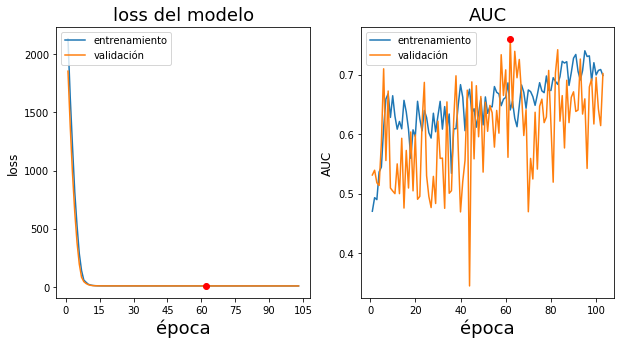

Epoch 104/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9664 - acc: 0.8519 - auc: 0.7304 - val_loss: 7.9983 - val_acc: 0.8577 - val_auc: 0.6454


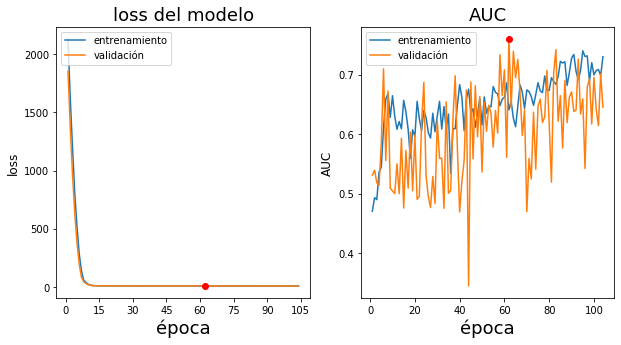

Epoch 105/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0035 - acc: 0.8566 - auc: 0.6694 - val_loss: 8.0083 - val_acc: 0.8577 - val_auc: 0.6831


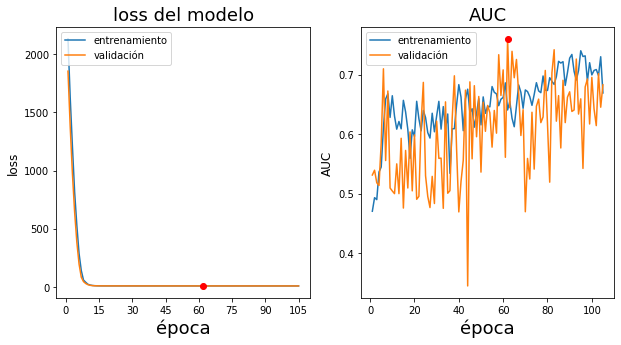

Epoch 106/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9744 - acc: 0.8557 - auc: 0.7042 - val_loss: 7.9981 - val_acc: 0.8577 - val_auc: 0.6327


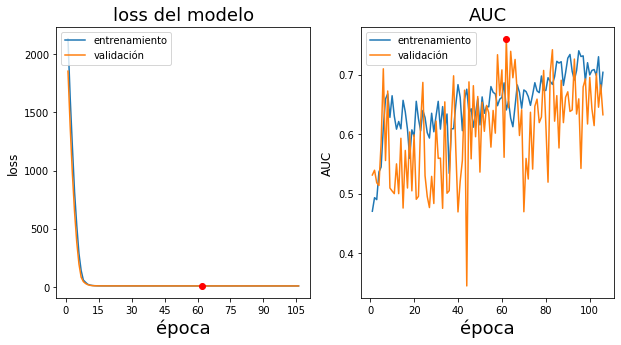

Epoch 107/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9475 - acc: 0.8510 - auc: 0.7116 - val_loss: 7.9809 - val_acc: 0.8577 - val_auc: 0.6175


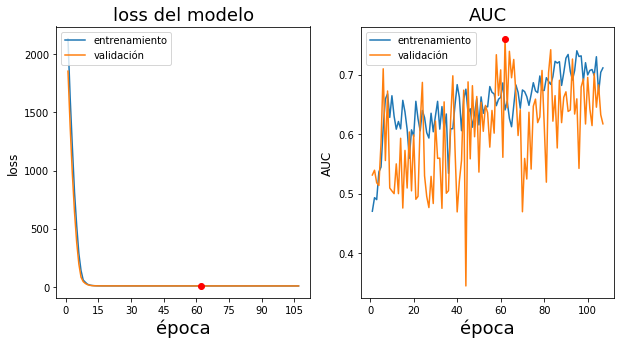

Epoch 108/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9632 - acc: 0.8519 - auc: 0.7233 - val_loss: 7.9530 - val_acc: 0.8577 - val_auc: 0.7417


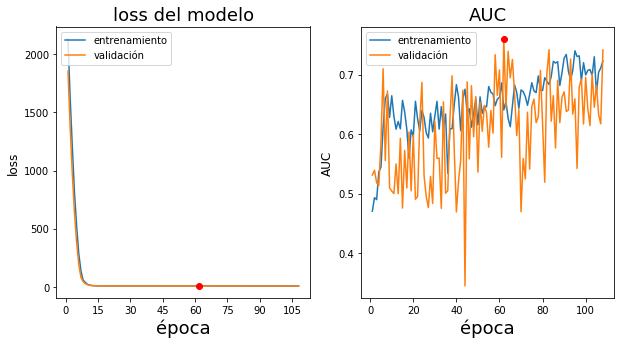

Epoch 109/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9447 - acc: 0.8510 - auc: 0.7344 - val_loss: 7.9670 - val_acc: 0.8577 - val_auc: 0.6490


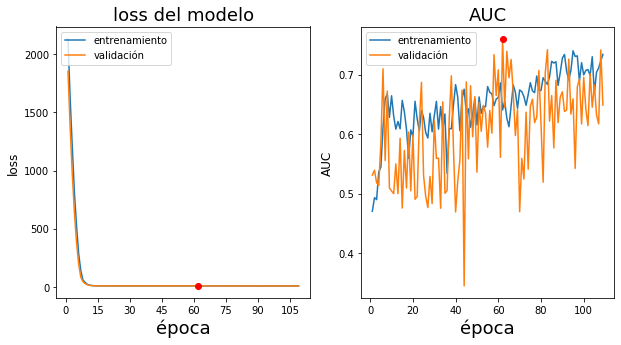

Epoch 110/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9137 - acc: 0.8613 - auc: 0.7418 - val_loss: 7.9982 - val_acc: 0.8577 - val_auc: 0.6082


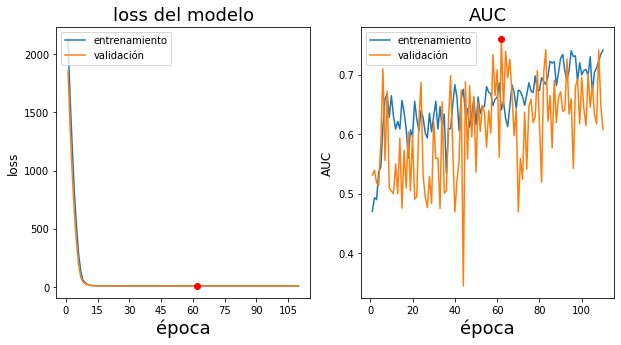

Epoch 111/1000
Learning rate = 0.00100
9/8 [================================] - 15s 2s/step - loss: 7.9684 - acc: 0.8547 - auc: 0.7197 - val_loss: 7.9687 - val_acc: 0.8577 - val_auc: 0.6832


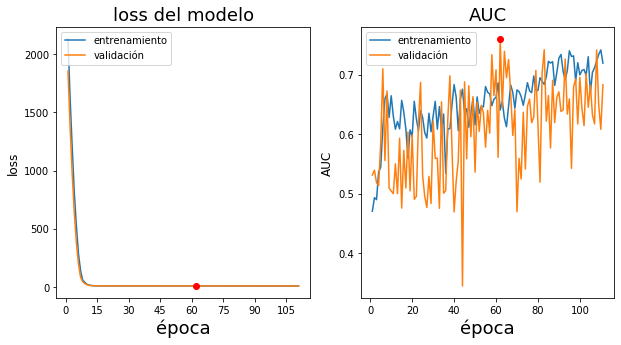

Epoch 112/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9592 - acc: 0.8566 - auc: 0.7108 - val_loss: 7.9808 - val_acc: 0.8577 - val_auc: 0.6489


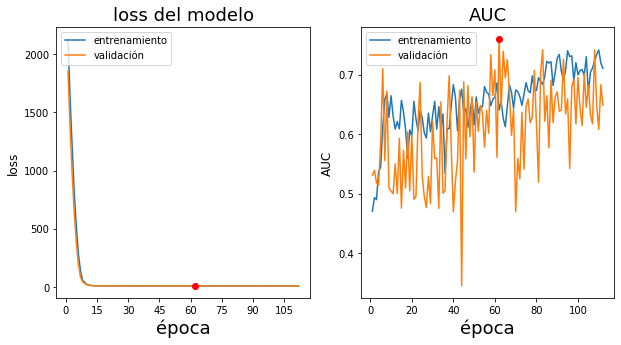

Epoch 113/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9613 - acc: 0.8538 - auc: 0.7222 - val_loss: 7.9573 - val_acc: 0.8577 - val_auc: 0.6944


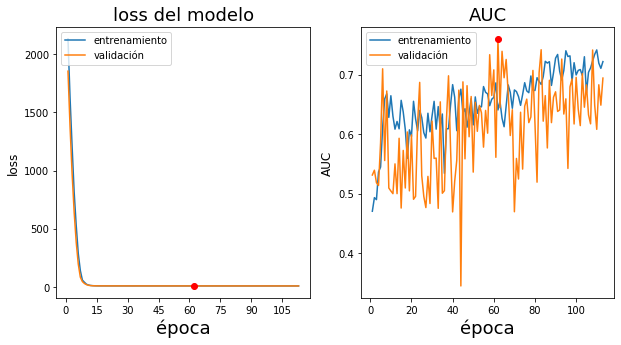

Epoch 114/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9325 - acc: 0.8566 - auc: 0.7336 - val_loss: 7.9994 - val_acc: 0.8577 - val_auc: 0.6459


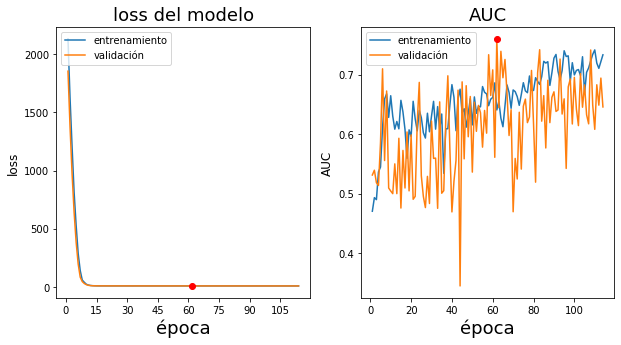

Epoch 115/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9755 - acc: 0.8529 - auc: 0.6695 - val_loss: 7.9755 - val_acc: 0.8577 - val_auc: 0.7060


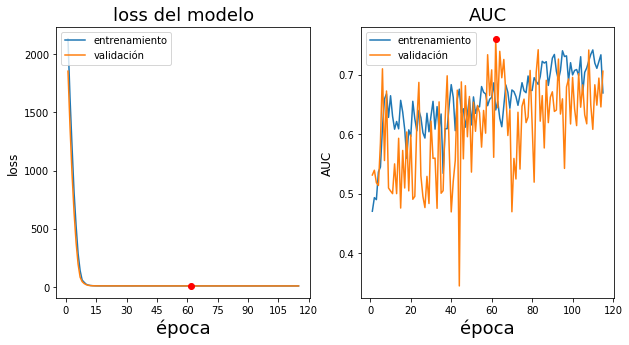

Epoch 116/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9649 - acc: 0.8585 - auc: 0.7022 - val_loss: 7.9669 - val_acc: 0.8577 - val_auc: 0.7249


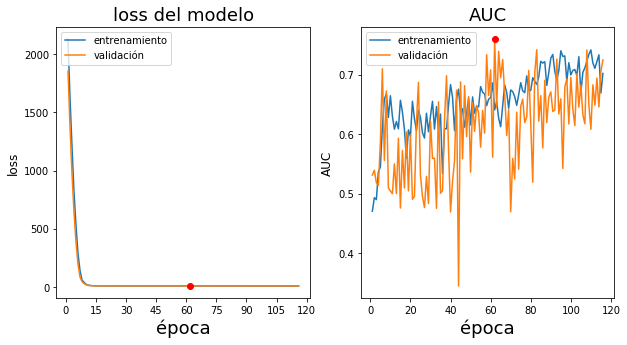

Epoch 117/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9364 - acc: 0.8529 - auc: 0.7290 - val_loss: 7.9829 - val_acc: 0.8577 - val_auc: 0.6578


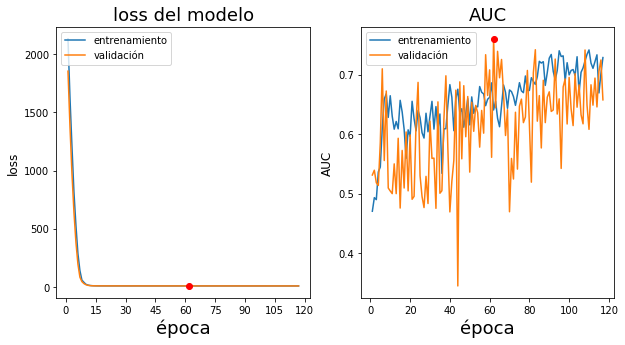

Epoch 118/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9353 - acc: 0.8547 - auc: 0.7260 - val_loss: 7.9982 - val_acc: 0.8577 - val_auc: 0.6458


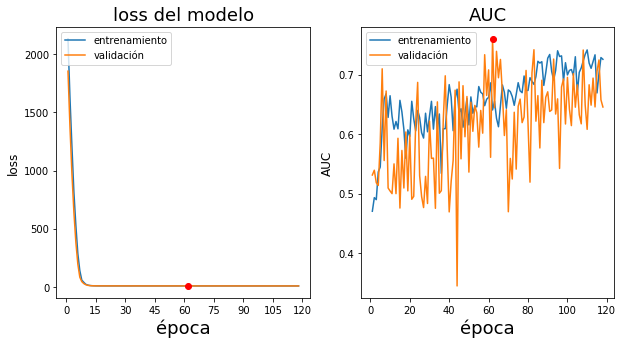

Epoch 119/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9490 - acc: 0.8594 - auc: 0.7465 - val_loss: 7.9678 - val_acc: 0.8577 - val_auc: 0.7263


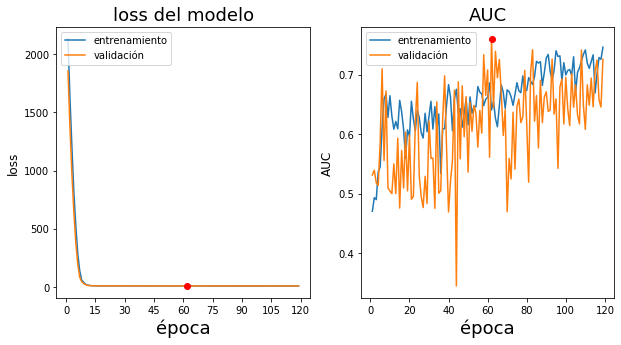

Epoch 120/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9617 - acc: 0.8575 - auc: 0.7339 - val_loss: 7.9714 - val_acc: 0.8577 - val_auc: 0.6647


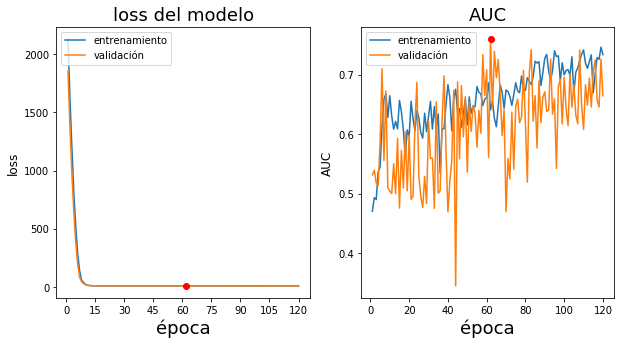

Epoch 121/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 8.0077 - acc: 0.8500 - auc: 0.6431 - val_loss: 8.0151 - val_acc: 0.8496 - val_auc: 0.6016


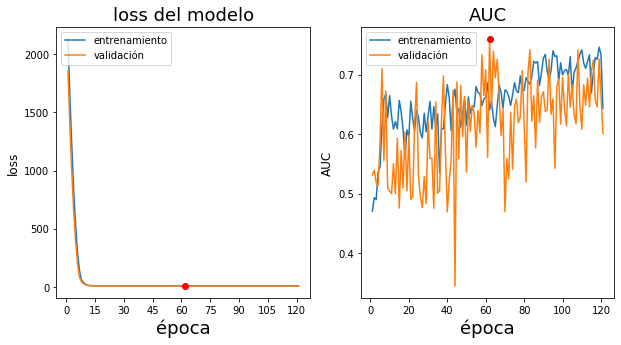

Epoch 122/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9910 - acc: 0.8529 - auc: 0.7040 - val_loss: 7.9963 - val_acc: 0.8577 - val_auc: 0.6233


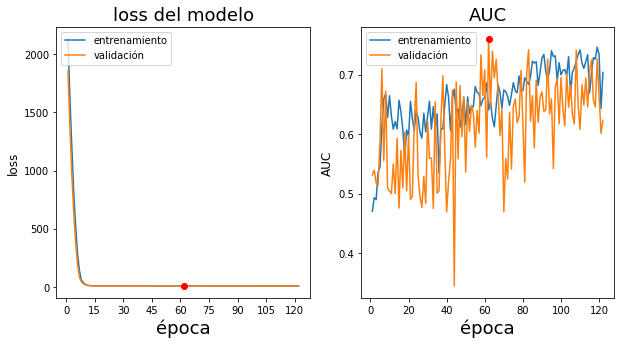

Epoch 123/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9446 - acc: 0.8529 - auc: 0.7185 - val_loss: 7.9721 - val_acc: 0.8577 - val_auc: 0.6471


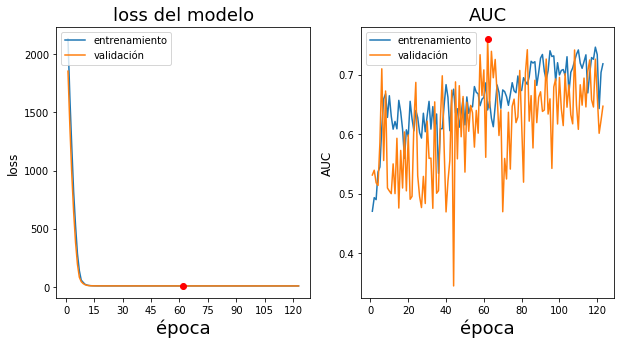

Epoch 124/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9291 - acc: 0.8538 - auc: 0.7557 - val_loss: 7.9648 - val_acc: 0.8577 - val_auc: 0.6245


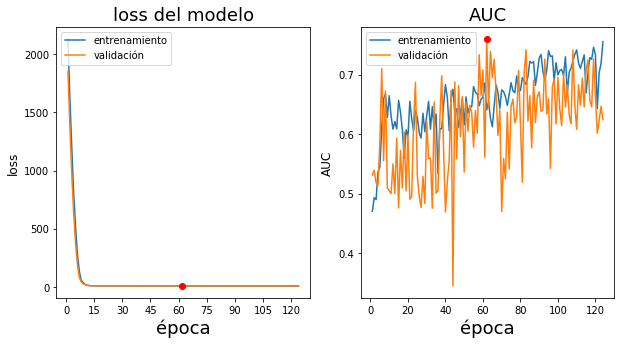

Epoch 125/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9278 - acc: 0.8557 - auc: 0.7494 - val_loss: 8.0010 - val_acc: 0.8577 - val_auc: 0.6180


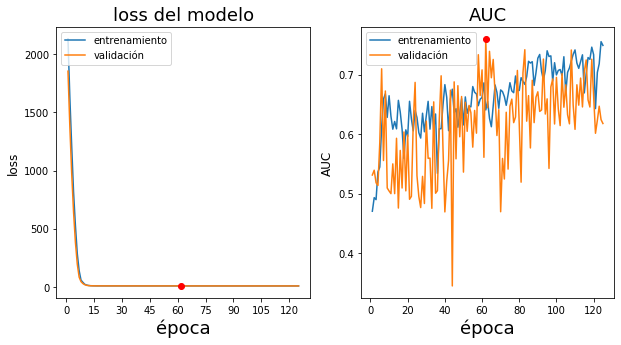

Epoch 126/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9335 - acc: 0.8632 - auc: 0.6946 - val_loss: 7.9394 - val_acc: 0.8577 - val_auc: 0.7043


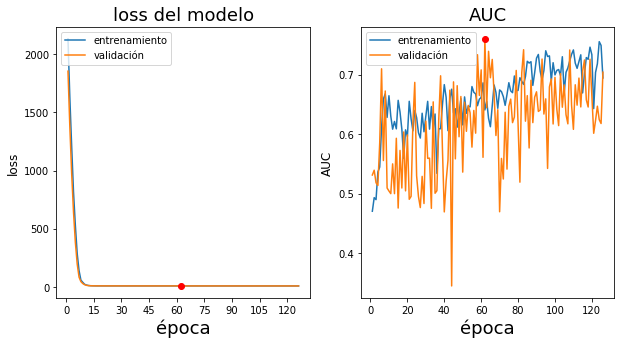

Epoch 127/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8987 - acc: 0.8632 - auc: 0.7319 - val_loss: 7.9962 - val_acc: 0.8577 - val_auc: 0.5655


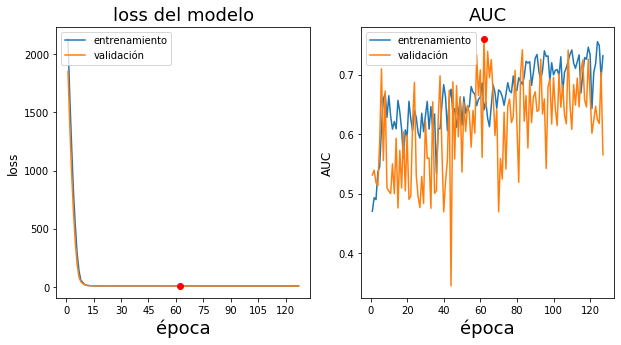

Epoch 128/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9305 - acc: 0.8594 - auc: 0.7410 - val_loss: 7.9796 - val_acc: 0.8577 - val_auc: 0.5788


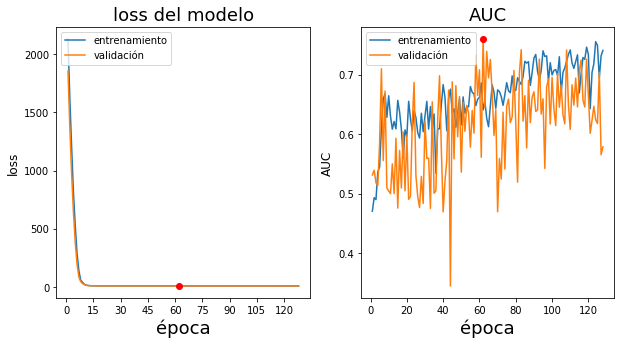

Epoch 129/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9271 - acc: 0.8594 - auc: 0.7145 - val_loss: 7.9202 - val_acc: 0.8577 - val_auc: 0.6978


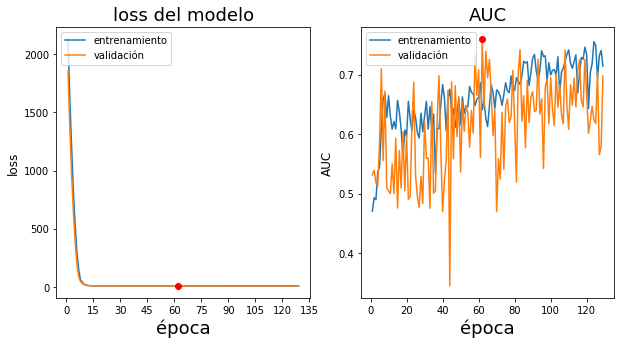

Epoch 130/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9310 - acc: 0.8538 - auc: 0.7159 - val_loss: 7.9833 - val_acc: 0.8577 - val_auc: 0.5693


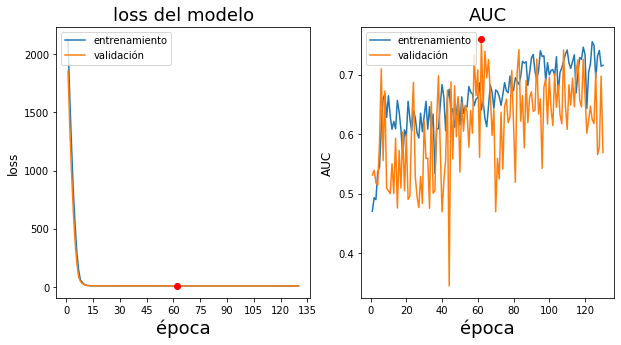

Epoch 131/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9104 - acc: 0.8641 - auc: 0.7180 - val_loss: 7.9427 - val_acc: 0.8577 - val_auc: 0.6111


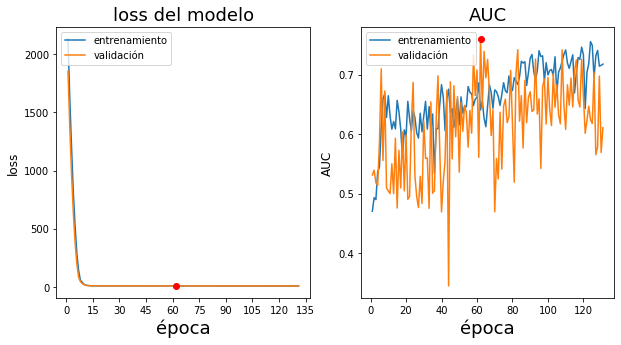

Epoch 132/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9082 - acc: 0.8594 - auc: 0.7415 - val_loss: 7.9515 - val_acc: 0.8577 - val_auc: 0.5821


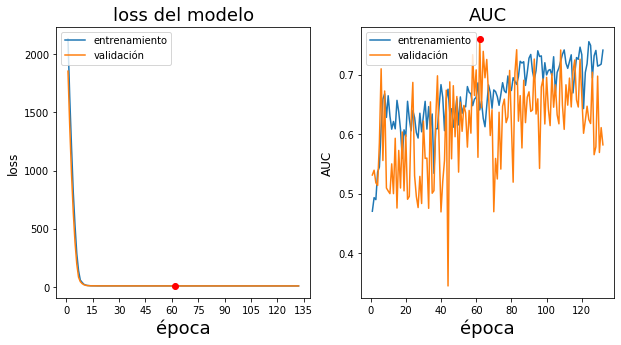

Epoch 133/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8953 - acc: 0.8575 - auc: 0.7389 - val_loss: 7.9310 - val_acc: 0.8577 - val_auc: 0.6227


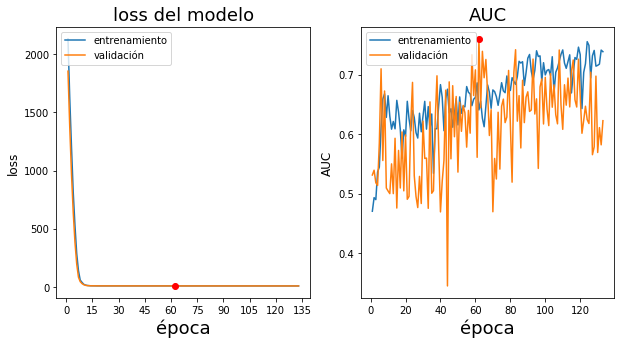

Epoch 134/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8994 - acc: 0.8566 - auc: 0.7333 - val_loss: 7.9628 - val_acc: 0.8577 - val_auc: 0.6428


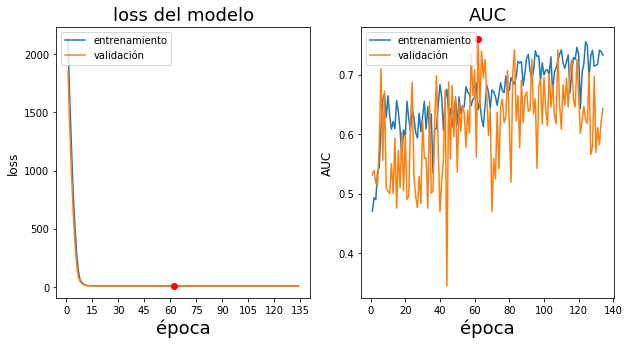

Epoch 135/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9334 - acc: 0.8585 - auc: 0.7139 - val_loss: 7.9827 - val_acc: 0.8577 - val_auc: 0.6347


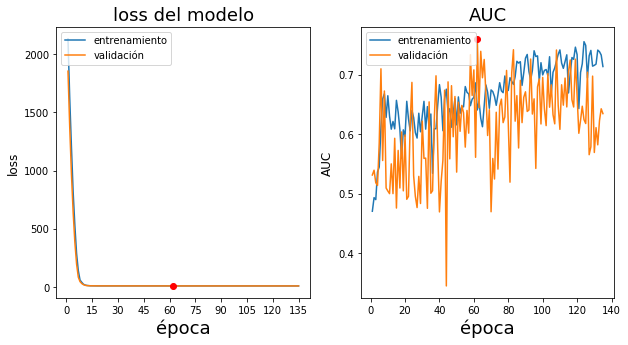

Epoch 136/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9192 - acc: 0.8482 - auc: 0.7349 - val_loss: 7.9562 - val_acc: 0.8577 - val_auc: 0.6646


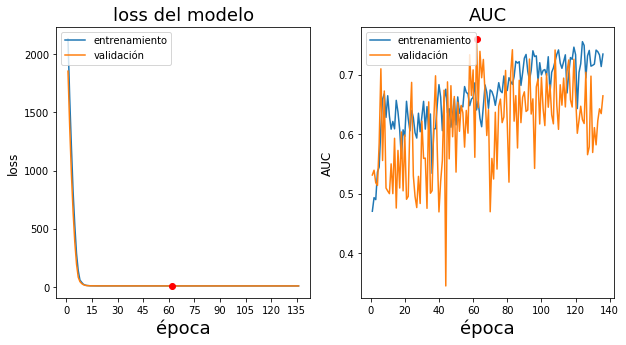

Epoch 137/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9218 - acc: 0.8547 - auc: 0.7212 - val_loss: 7.9368 - val_acc: 0.8496 - val_auc: 0.6477


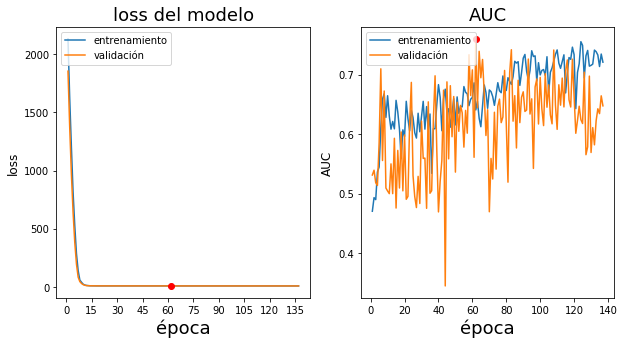

Epoch 138/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9007 - acc: 0.8594 - auc: 0.7445 - val_loss: 7.9567 - val_acc: 0.8537 - val_auc: 0.6159


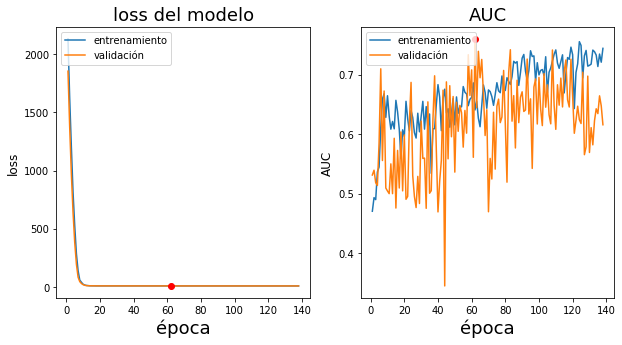

Epoch 139/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9223 - acc: 0.8622 - auc: 0.7274 - val_loss: 8.0249 - val_acc: 0.8577 - val_auc: 0.5191


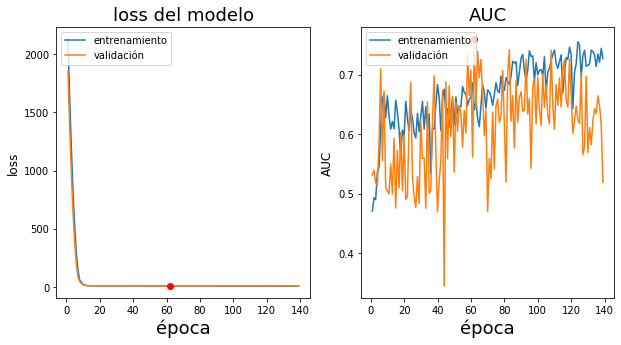

Epoch 140/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9731 - acc: 0.8613 - auc: 0.6752 - val_loss: 7.9356 - val_acc: 0.8577 - val_auc: 0.7496


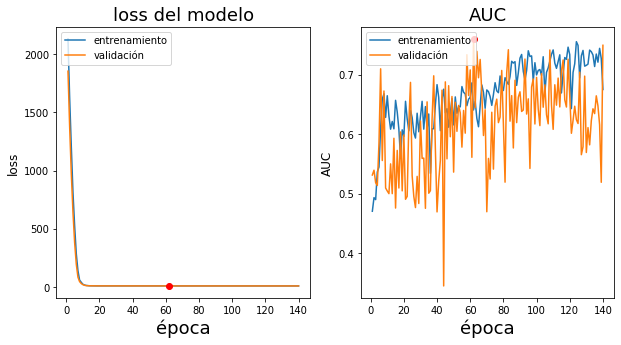

Epoch 141/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9359 - acc: 0.8613 - auc: 0.7455 - val_loss: 7.9365 - val_acc: 0.8577 - val_auc: 0.6677


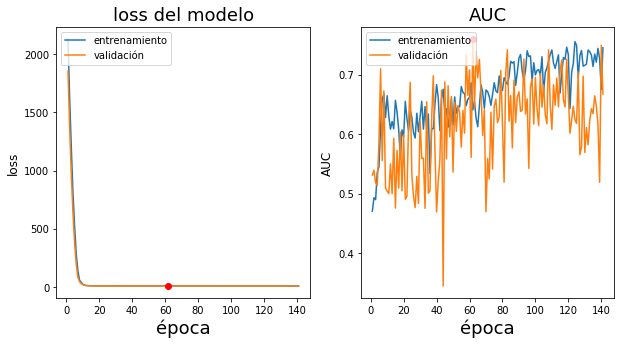

Epoch 142/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9129 - acc: 0.8557 - auc: 0.7317 - val_loss: 7.9341 - val_acc: 0.8577 - val_auc: 0.6939


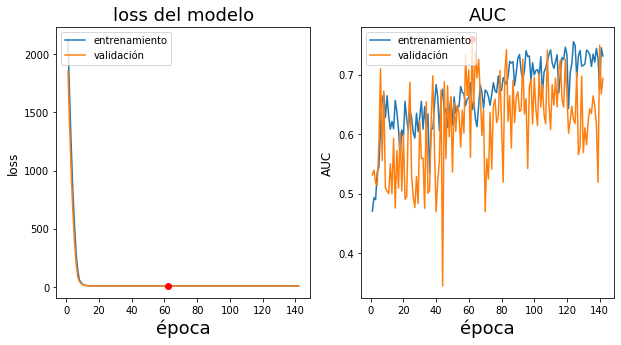

Epoch 143/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9109 - acc: 0.8566 - auc: 0.7407 - val_loss: 7.9646 - val_acc: 0.8577 - val_auc: 0.6183


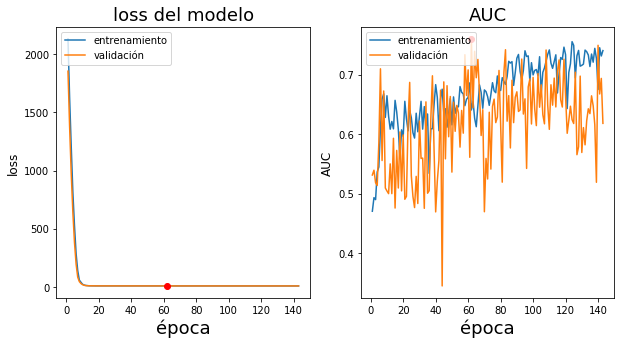

Epoch 144/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9141 - acc: 0.8510 - auc: 0.7345 - val_loss: 7.9541 - val_acc: 0.8577 - val_auc: 0.5440


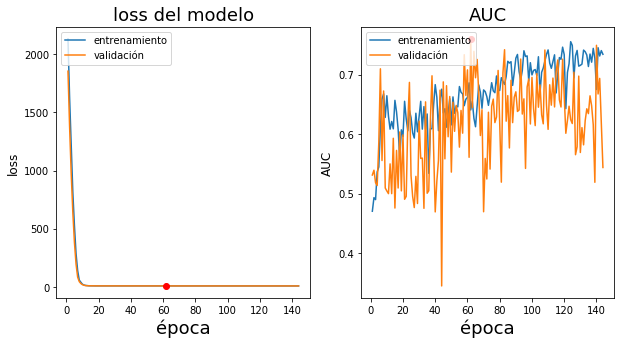

Epoch 145/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9196 - acc: 0.8519 - auc: 0.7356 - val_loss: 7.9719 - val_acc: 0.8577 - val_auc: 0.6044


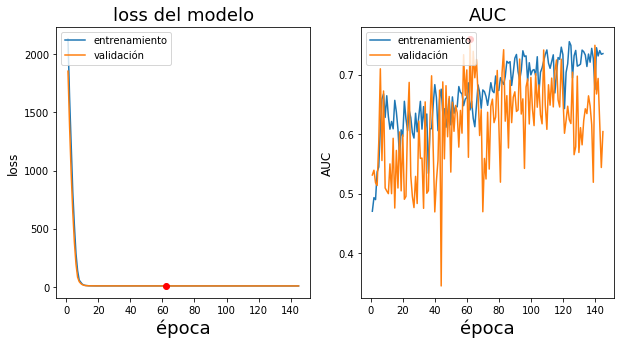

Epoch 146/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9293 - acc: 0.8538 - auc: 0.7054 - val_loss: 7.9783 - val_acc: 0.8577 - val_auc: 0.6995


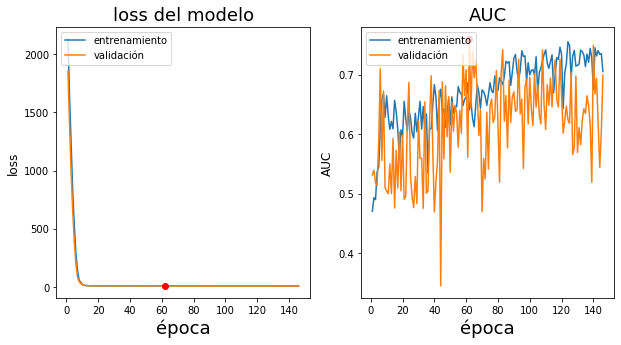

Epoch 147/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9179 - acc: 0.8538 - auc: 0.7344 - val_loss: 7.9441 - val_acc: 0.8577 - val_auc: 0.6819


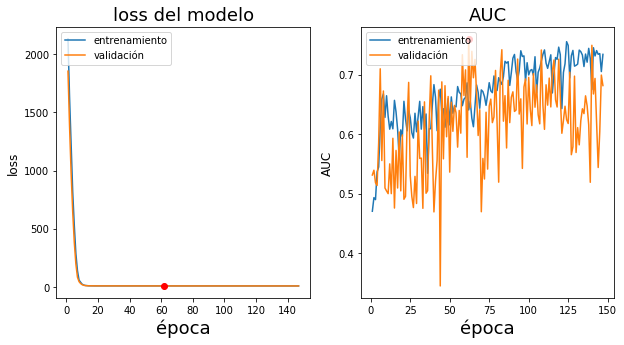

Epoch 148/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9120 - acc: 0.8585 - auc: 0.7468 - val_loss: 7.9291 - val_acc: 0.8577 - val_auc: 0.6382


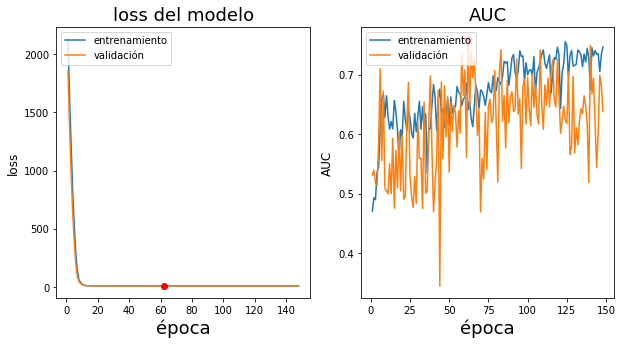

Epoch 149/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8991 - acc: 0.8519 - auc: 0.7424 - val_loss: 7.9679 - val_acc: 0.8577 - val_auc: 0.5414


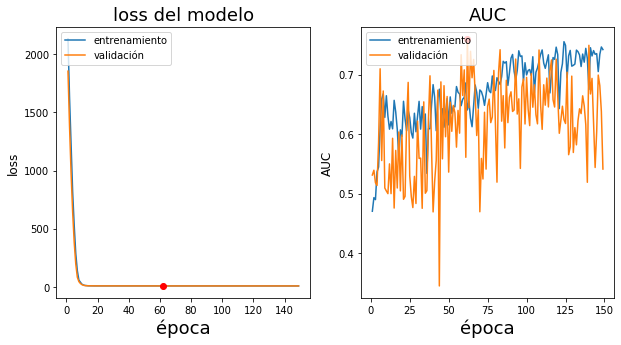

Epoch 150/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.9002 - acc: 0.8566 - auc: 0.7208 - val_loss: 7.9923 - val_acc: 0.8577 - val_auc: 0.4763


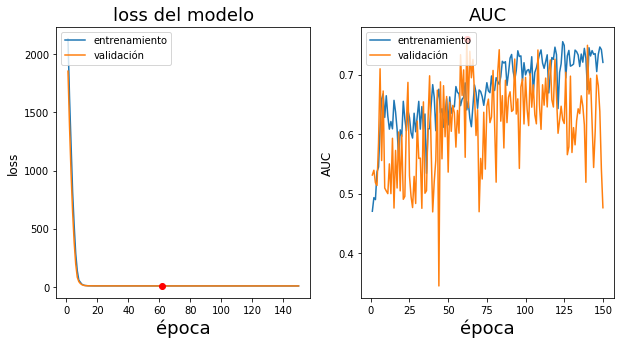

Epoch 151/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8663 - acc: 0.8575 - auc: 0.7444 - val_loss: 7.9145 - val_acc: 0.8577 - val_auc: 0.6657


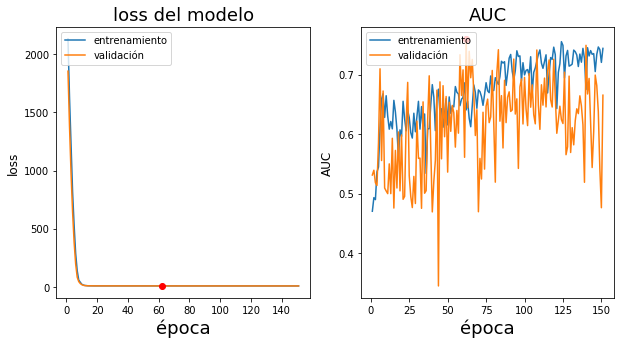

Epoch 152/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8800 - acc: 0.8613 - auc: 0.7498 - val_loss: 7.8991 - val_acc: 0.8455 - val_auc: 0.6678


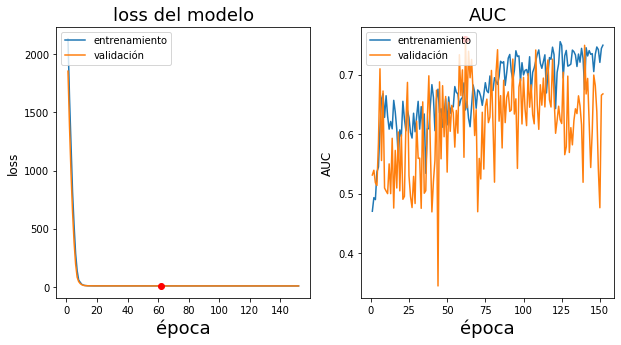

Epoch 153/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8913 - acc: 0.8575 - auc: 0.7254 - val_loss: 7.8893 - val_acc: 0.8577 - val_auc: 0.6881


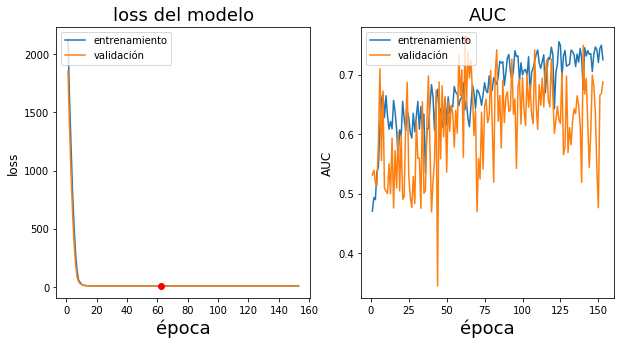

Epoch 154/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8837 - acc: 0.8604 - auc: 0.7106 - val_loss: 7.9453 - val_acc: 0.8577 - val_auc: 0.6011


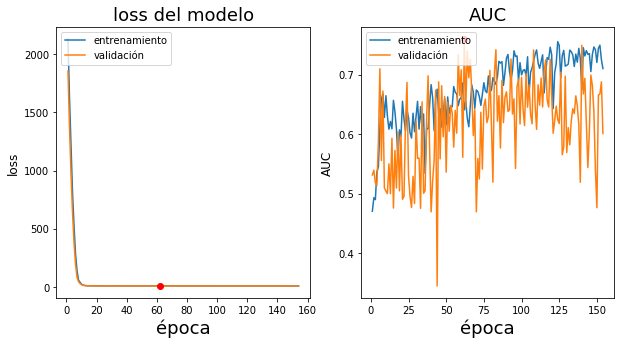

Epoch 155/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8933 - acc: 0.8585 - auc: 0.6896 - val_loss: 7.9299 - val_acc: 0.8577 - val_auc: 0.6729


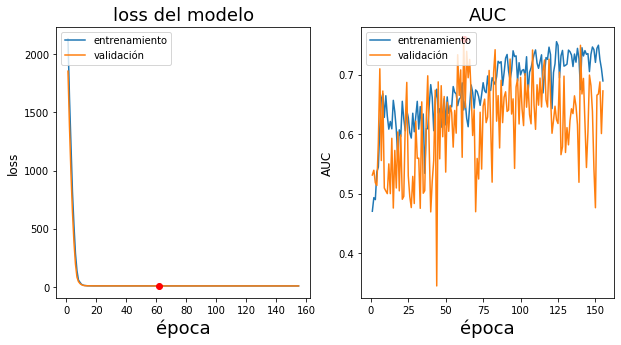

Epoch 156/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8679 - acc: 0.8622 - auc: 0.7373 - val_loss: 7.9262 - val_acc: 0.8333 - val_auc: 0.6923


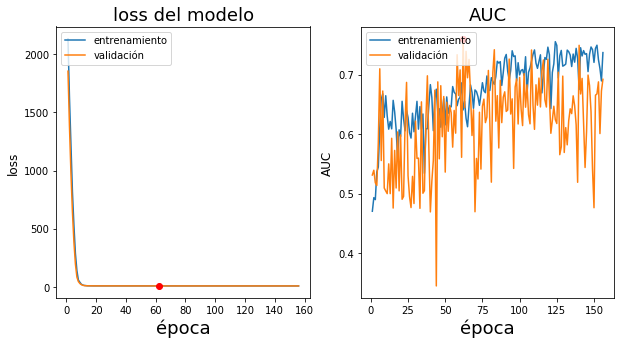

Epoch 157/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8864 - acc: 0.8594 - auc: 0.7164 - val_loss: 7.8989 - val_acc: 0.8577 - val_auc: 0.6502


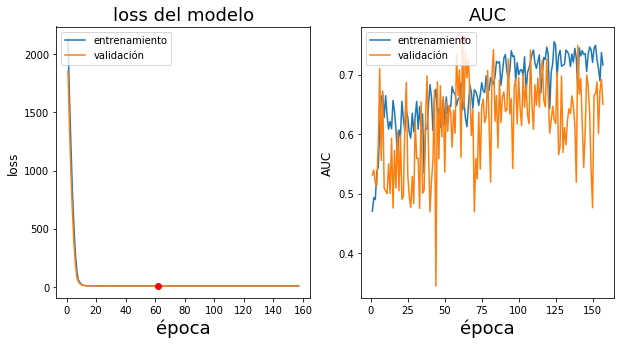

Epoch 158/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8734 - acc: 0.8585 - auc: 0.7316 - val_loss: 7.9273 - val_acc: 0.8577 - val_auc: 0.6817


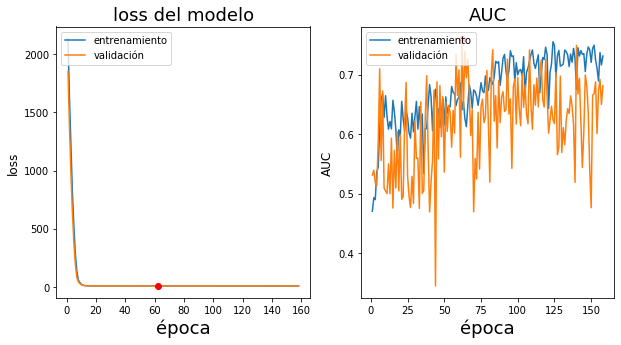

Epoch 159/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8816 - acc: 0.8538 - auc: 0.7663 - val_loss: 7.9261 - val_acc: 0.8537 - val_auc: 0.6758


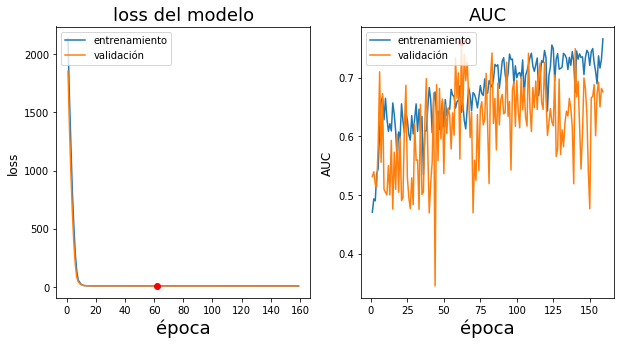

Epoch 160/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8820 - acc: 0.8622 - auc: 0.7219 - val_loss: 7.8535 - val_acc: 0.8577 - val_auc: 0.6568


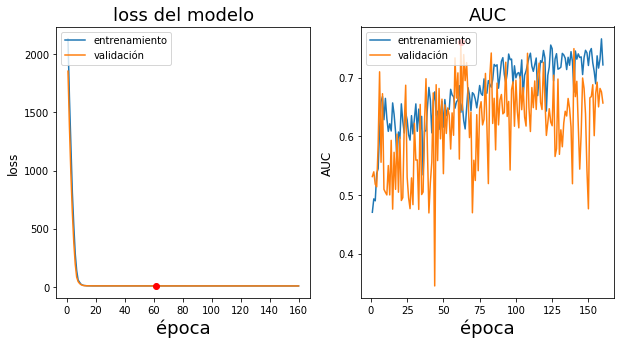

Epoch 161/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8432 - acc: 0.8622 - auc: 0.7514 - val_loss: 7.8969 - val_acc: 0.8577 - val_auc: 0.6524


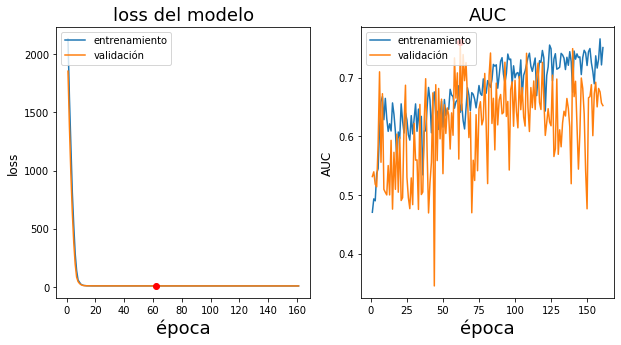

Epoch 162/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.9146 - acc: 0.8416 - auc: 0.7322 - val_loss: 7.9563 - val_acc: 0.8577 - val_auc: 0.6368


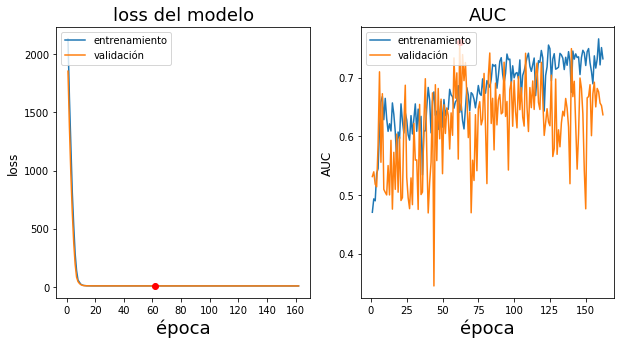

Epoch 163/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8780 - acc: 0.8557 - auc: 0.7471 - val_loss: 7.9158 - val_acc: 0.8577 - val_auc: 0.5972


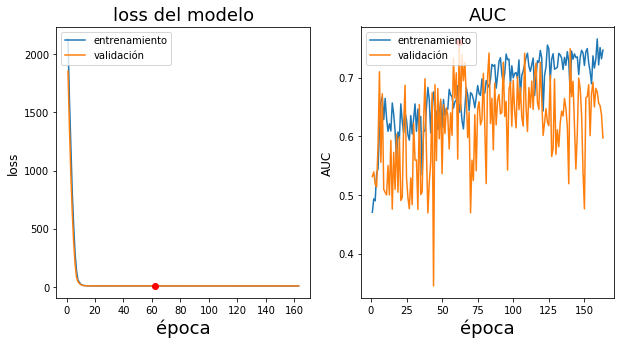

Epoch 164/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8723 - acc: 0.8622 - auc: 0.7340 - val_loss: 7.8591 - val_acc: 0.8577 - val_auc: 0.6653


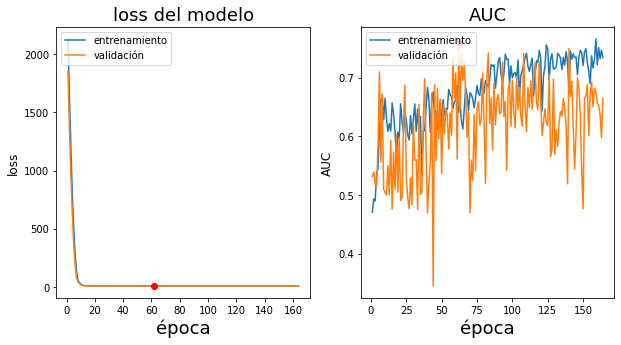

Epoch 165/1000
Learning rate = 0.00100
9/8 [================================] - 15s 2s/step - loss: 7.8686 - acc: 0.8529 - auc: 0.7446 - val_loss: 7.9156 - val_acc: 0.8496 - val_auc: 0.6792


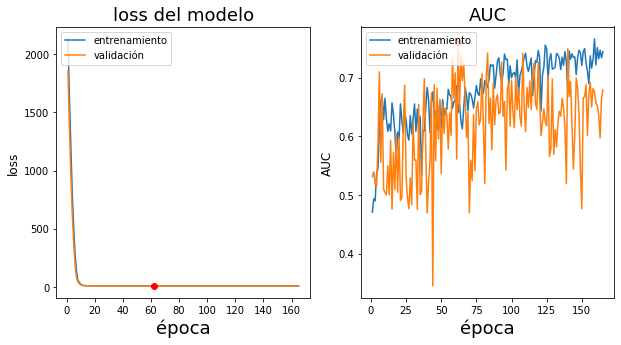

Epoch 166/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8987 - acc: 0.8547 - auc: 0.7168 - val_loss: 7.9627 - val_acc: 0.8211 - val_auc: 0.6836


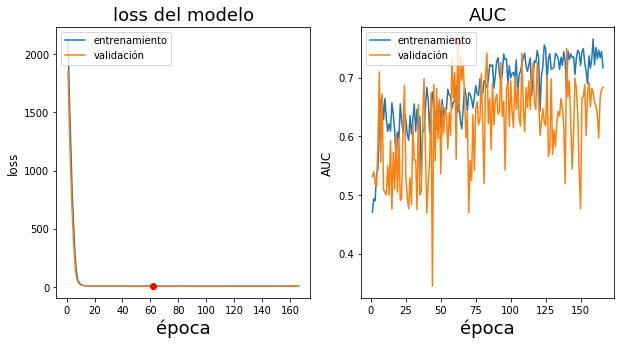

Epoch 167/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8789 - acc: 0.8613 - auc: 0.7462 - val_loss: 7.9056 - val_acc: 0.8577 - val_auc: 0.6661


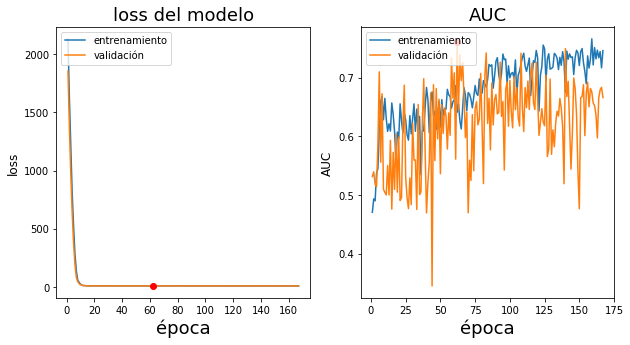

Epoch 168/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8825 - acc: 0.8575 - auc: 0.7512 - val_loss: 7.9053 - val_acc: 0.8577 - val_auc: 0.6720


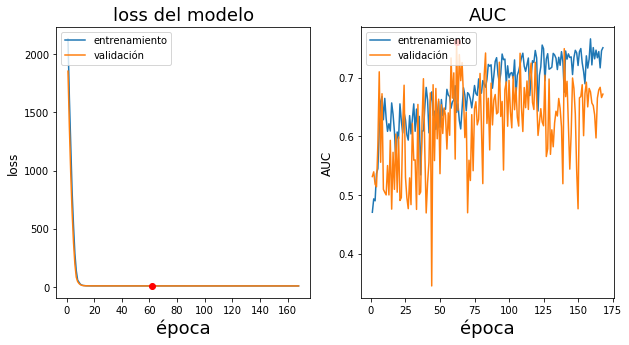

Epoch 169/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8658 - acc: 0.8622 - auc: 0.7649 - val_loss: 7.8988 - val_acc: 0.8577 - val_auc: 0.6131


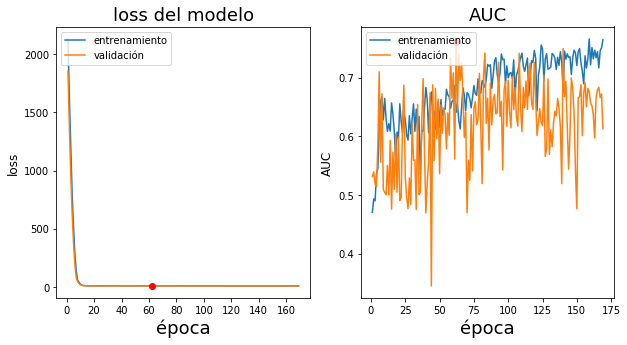

Epoch 170/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8765 - acc: 0.8585 - auc: 0.7262 - val_loss: 7.9045 - val_acc: 0.8577 - val_auc: 0.6719


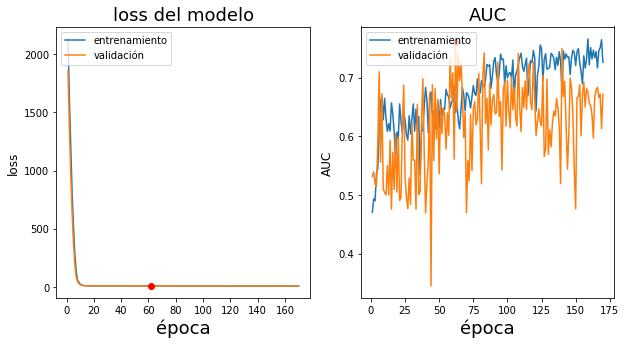

Epoch 171/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8464 - acc: 0.8660 - auc: 0.7690 - val_loss: 7.8871 - val_acc: 0.8577 - val_auc: 0.6528


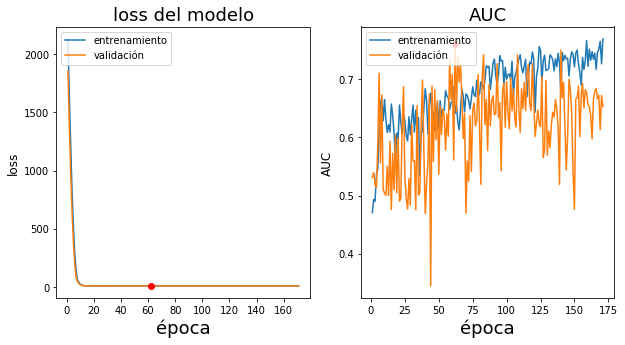

Epoch 172/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8463 - acc: 0.8604 - auc: 0.7417 - val_loss: 7.8779 - val_acc: 0.8577 - val_auc: 0.6903


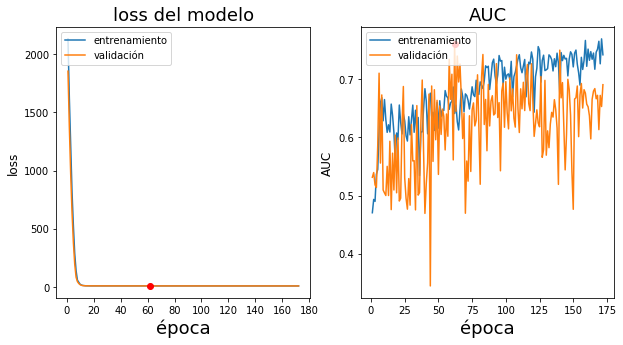

Epoch 173/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8645 - acc: 0.8519 - auc: 0.7287 - val_loss: 7.8837 - val_acc: 0.8211 - val_auc: 0.6506


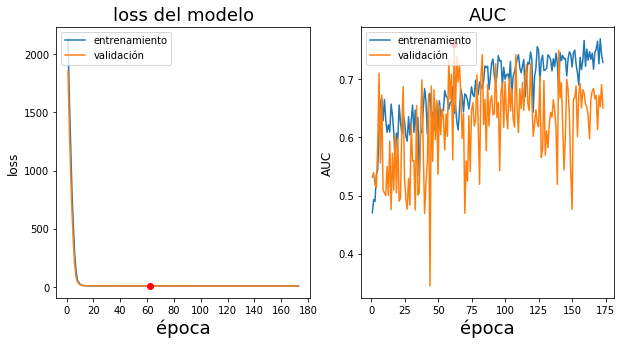

Epoch 174/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8784 - acc: 0.8510 - auc: 0.7330 - val_loss: 7.9035 - val_acc: 0.8537 - val_auc: 0.6939


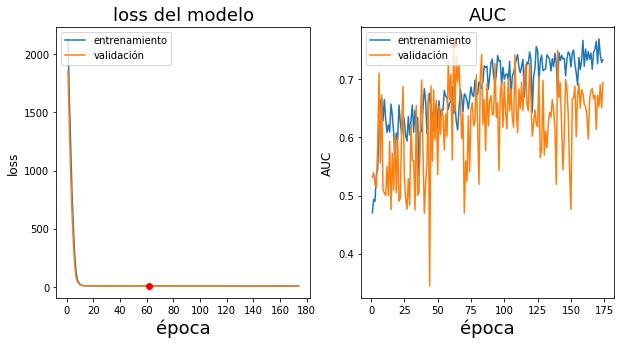

Epoch 175/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8665 - acc: 0.8529 - auc: 0.7532 - val_loss: 7.9003 - val_acc: 0.8252 - val_auc: 0.7165


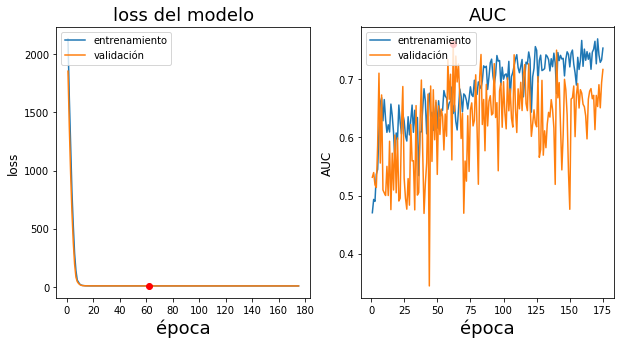

Epoch 176/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8456 - acc: 0.8585 - auc: 0.7396 - val_loss: 7.9014 - val_acc: 0.8537 - val_auc: 0.6928


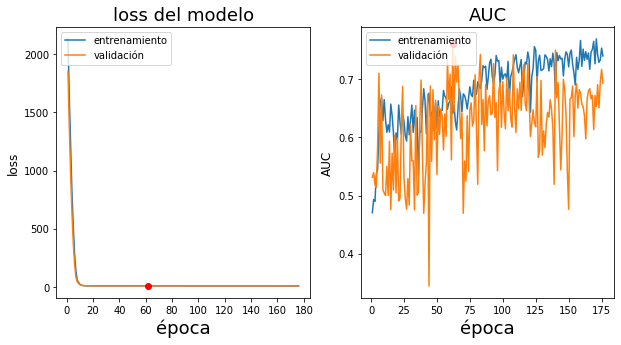

Epoch 177/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8520 - acc: 0.8604 - auc: 0.7494 - val_loss: 7.8648 - val_acc: 0.8577 - val_auc: 0.7154


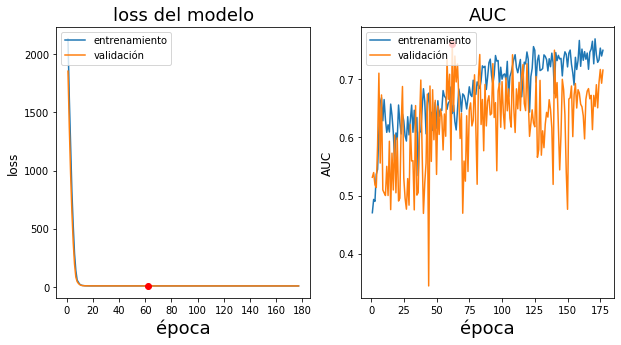

Epoch 178/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8429 - acc: 0.8613 - auc: 0.7616 - val_loss: 7.8707 - val_acc: 0.8577 - val_auc: 0.6884


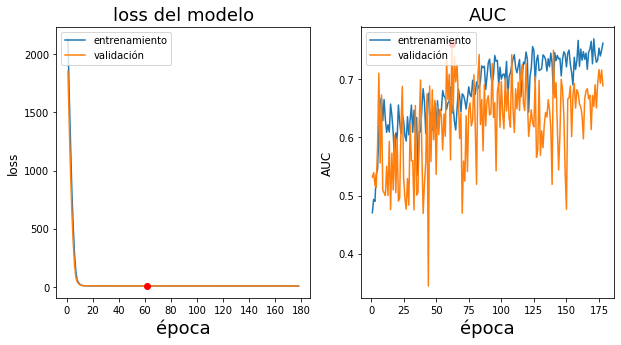

Epoch 179/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8379 - acc: 0.8632 - auc: 0.7296 - val_loss: 7.8782 - val_acc: 0.8577 - val_auc: 0.5768


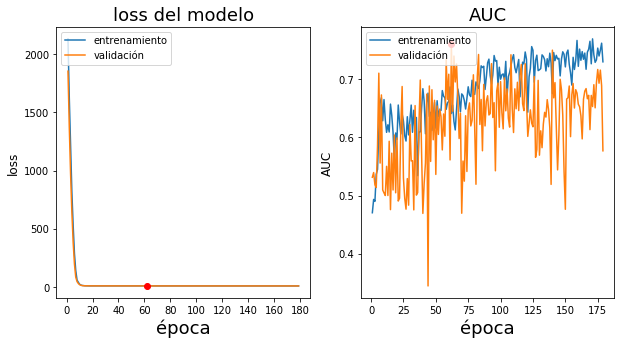

Epoch 180/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8435 - acc: 0.8566 - auc: 0.7303 - val_loss: 7.8647 - val_acc: 0.8577 - val_auc: 0.6313


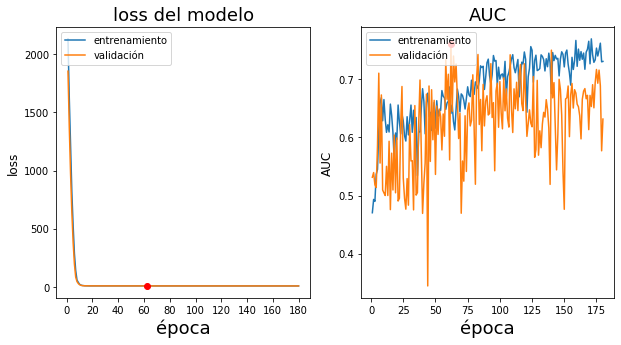

Epoch 181/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8364 - acc: 0.8604 - auc: 0.7738 - val_loss: 7.8921 - val_acc: 0.8374 - val_auc: 0.6731


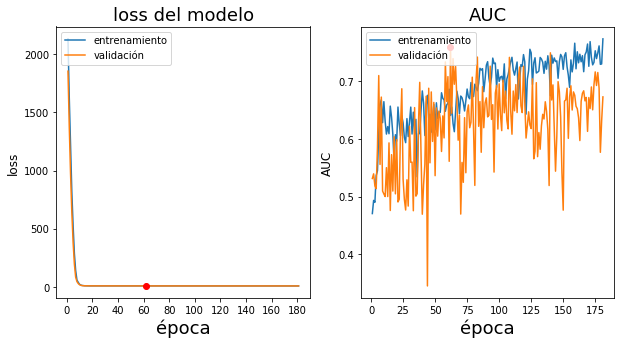

Epoch 182/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8764 - acc: 0.8500 - auc: 0.7045 - val_loss: 7.9018 - val_acc: 0.8455 - val_auc: 0.7244


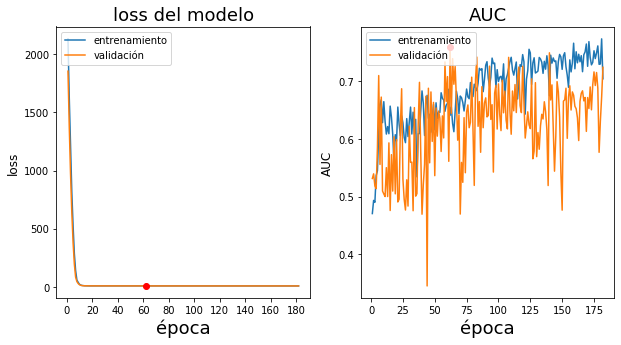

Epoch 183/1000
Learning rate = 0.00100
9/8 [================================] - 14s 2s/step - loss: 7.8645 - acc: 0.8669 - auc: 0.7075 - val_loss: 7.8742 - val_acc: 0.8374 - val_auc: 0.6855


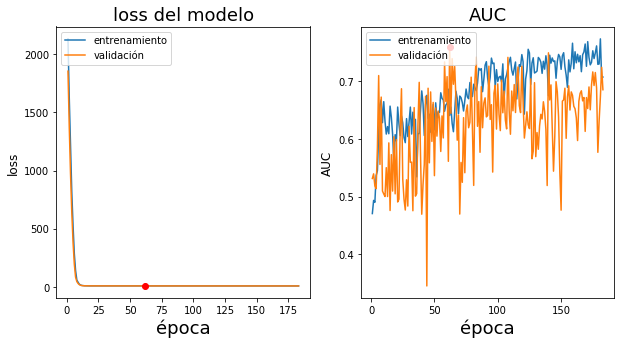

Epoch 184/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8410 - acc: 0.8604 - auc: 0.7439 - val_loss: 7.8623 - val_acc: 0.8577 - val_auc: 0.5590


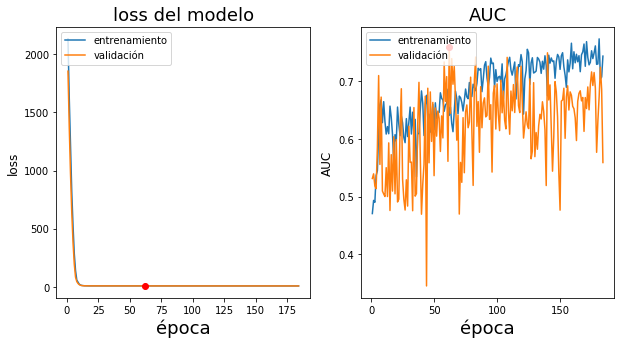

Epoch 185/1000
Learning rate = 0.00100
9/8 [================================] - 13s 1s/step - loss: 7.8464 - acc: 0.8594 - auc: 0.7154 - val_loss: 7.9719 - val_acc: 0.7358 - val_auc: 0.7340


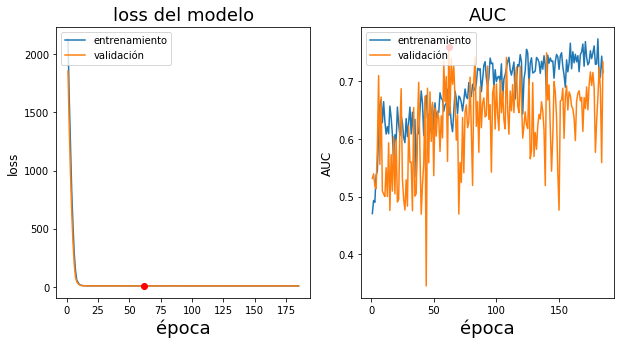

Epoch 186/1000
Learning rate = 0.00100


In [ ]:
# read created data by GANs and AE

import random

previous_val_auc = 0


df = pd.DataFrame()
for n_ae in size_AE:
    print ("Numero imagenes AE %d" % n)
        for n in size_gans:
            print ("Numero imagenes GANs %d" % n)

            X_train = np.load(os.path.join(path_images, 'X_train.npy'))
            X_val = np.load(os.path.join(path_images, 'X_val.npy'))
            X_test = np.load(os.path.join(path_images, 'X_test.npy'))
            y_train = np.load(os.path.join(path_images, 'y_train.npy'))
            y_val = np.load(os.path.join(path_images, 'y_val.npy'))
            y_test = np.load(os.path.join(path_images, 'y_test.npy'))
            
            if n_ae != 0:
                X_train_0_ae = np.load(os.path.join(path_gans, 'AE_covid_0_num_imag_%d.npy' % n_ae))
                X_train_1_ae = np.load(os.path.join(path_gans, 'AE_covid_1_num_imag_%d.npy'% n_ae))

                ratio_neg = np.count_nonzero(y_train == 1) / len(y_train)
                size = round(ratio_neg * X_train_1_gans.shape[0])
                lista = range(X_train_1_gans.shape[0]-1)


                ind = random.sample(lista, size)
                X_train_1_gans = X_train_1_gans[ind,:]

                # create target
                X_train_1_ae = np.ones(X_train_1_ae.shape[0], dtype=int)
                X_train_0_ae = np.zeros(X_train_0_ae.shape[0], dtype=int)


                # join data

                X_train_ae = np.concatenate((X_train_1_ae, X_train_0_ae))
                y_train_ae = np.concatenate((y_train_1_ae, y_train_0_ae))

                X_train = np.concatenate((X_train, X_train_ae ))
                y_train = np.concatenate((y_train, y_train_ae ))

            if n != 0:
                X_train_0_gans = np.load(os.path.join(path_gans, 'covid_0_num_imag_%d.npy' % n))
                X_train_1_gans = np.load(os.path.join(path_gans, 'covid_1_num_imag_%d.npy'% n))

                ratio_neg = np.count_nonzero(y_train == 1) / len(y_train)
                size = round(ratio_neg * X_train_1_gans.shape[0])
                lista = range(X_train_1_gans.shape[0]-1)


                ind = random.sample(lista, size)
                X_train_1_gans = X_train_1_gans[ind,:]

                # create target
                y_train_1_gans = np.ones(X_train_1_gans.shape[0], dtype=int)
                y_train_0_gans = np.zeros(X_train_0_gans.shape[0], dtype=int)


                # join data

                X_train_gans = np.concatenate((X_train_1_gans, X_train_0_gans))
                y_train_gans = np.concatenate((y_train_1_gans, y_train_0_gans))

                X_train = np.concatenate((X_train, X_train_gans))
                y_train = np.concatenate((y_train, y_train_gans))


            # train
            ratio_pos = np.count_nonzero(y_train == 0) / len(y_train)
            ratio_neg = np.count_nonzero(y_train == 1) / len(y_train)
            class_weight_train = np.array((ratio_pos, ratio_neg))

            # val
            ratio_pos = np.count_nonzero(y_val == 0) / len(y_val)
            ratio_neg = np.count_nonzero(y_val == 1) / len(y_val)
            class_weight_val = np.array((ratio_pos, ratio_neg))

            datagen = ImageDataGenerator(featurewise_center=True, 
                                     featurewise_std_normalization=True,
                                     rotation_range=90,
                                     brightness_range = (0.25, 0.75))
            datagen.fit(X_train)

            base_model_augmented, model_augmented = get_model(learning_rate)

            out = model_augmented.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size, seed=seed),
                             validation_data=(X_val, y_val),
                             steps_per_epoch=len(X_train) / batch_size, 
                             epochs=epochs,
                             class_weight=class_weight_train,
                             callbacks = callbacks_list,       
                             verbose=1)

            if(len(out.history)):
                acum_tr_auc.append(out.history['auc'][0])
                acum_val_auc.append(out.history['val_auc'][0])
                acum_tr_loss.append(out.history['loss'][0])
                acum_val_loss.append(out.history['val_loss'][0])

                acum = pd.DataFrame([acum_tr_auc, acum_val_auc, acum_tr_loss, acum_val_loss])
                acum.to_csv(os.path.join(path_results,'acum_results_no_augmentation.csv'))

            
                clear_output()
                best_i = np.argmax(acum_val_auc)
                grafica_entrenamiento(acum_tr_auc, acum_val_auc, acum_tr_loss, acum_val_loss, best_i)
                    ### save loss and auc of train and val     
                stopped_epoch = early_stopping.stopped_epoch
                train_loss = out.history['loss'][stopped_epoch-1]
                val_loss = out.history['val_loss'][stopped_epoch-1]
                train_auc = out.history['auc'][stopped_epoch-1]
                val_auc = out.history['val_auc'][stopped_epoch-1]
                model = out.model

                pred_train = model.predict(X_train)
                pred_val = model.predict(X_val)

                train_auc = roc_auc_score(y_true = y_train, y_score = pred_train)
                val_auc = roc_auc_score(y_true = y_val, y_score = pred_val)


                res = pd.DataFrame([n_ae, n, epochs, batch_size, stopped_epoch, train_auc, val_auc])
                df = pd.concat([df, res], axis=1)

                df.to_csv(os.path.join(path_results,'model_results_augmentation.csv')) 

                model.save(os.path.join(path_results, 'model_augmentation_%d.h5' % n))

                if(previous_val_auc < val_auc):
                    save_dir = os.path.join(
                            os.getcwd(),
                            '../model_results_y')
                    if not os.path.isdir(save_dir):
                            os.makedirs(save_dir)
                        model.save(os.path.join(path_results, 'model_no_augmentation_%d.h5' % n))

                    previous_val_auc = val_auc


                           
df.index = ['size_ae', 'size_gans', 'epochs', 'batch_size','early_stopping', 'train_auc', 'val_auc']
df.to_csv(os.path.join(path_results,'model_results_augmentation.csv'))              

In [ ]:
save_dir = os.path.join(
    os.getcwd(),
    'model_results'
)
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
model.save(os.path.join(save_dir, 'model.h5')) 

### Predict

In [ ]:
pred_train = model.predict(X_train)
pred_val = model.predict(X_val)
pred_test = model.predict(X_test)

In [ ]:
pred_train.shape

In [ ]:
pred_val.shape

### Metrics

In [ ]:
auc_train = roc_auc_score(y_true = y_train, y_score = pred_train)
auc_val = roc_auc_score(y_true = y_val, y_score = pred_val)
# auc_test = roc_auc_score(y_true = y_test, y_score = pred_test)
auc_test = None
print('AUC train = %s - AUC val = %s - AUC test = %s' % (str(auc_train), str(auc_val), str(auc_test)))

In [ ]:
y_labels_train = (pred_train >= 0.5).astype(int)
y_labels_val = (pred_val >= 0.5).astype(int)
# y_labels_test = (pred_test >= 0.5).astype(int)
cm_train = confusion_matrix(y_pred = y_labels_train, y_true = y_train)
cm_val = confusion_matrix(y_pred = y_labels_val, y_true = y_val)
# cm_test = confusion_matrix(y_pred = y_labels_test, y_true = y_test)
print(cm_train)
print(cm_val)
# print(cm_test)

### Save output

In [ ]:
np.savetxt(os.path.join(path_dcgan, 'predictions_train_500_gans.csv'), pred_train, delimiter=";")
np.savetxt(os.path.join(path_dcgan, 'y_train_500_gans.csv'), y_train, delimiter=";")
np.savetxt(os.path.join(path_dcgan, 'predictions_val_500_gans.csv'), pred_val, delimiter=";")
np.savetxt(os.path.join(path_dcgan, 'y_val_500_gans.csv'), y_val, delimiter=";")
np.savetxt(os.path.join(path_dcgan, 'predictions_test_500_gans.csv'),pred_test, delimiter=";")
np.savetxt(os.path.join(path_dcgan, 'y_test_500_gans.csv'), y_test, delimiter=";")

# Results

## AUC confidence intervals

In [ ]:
AUC_CI_train = bootstrap_auc(y_train, pred_train, bootstraps = 100, fold_size = 1000,)
AUC_CI_val = bootstrap_auc(y_val, pred_val, bootstraps = 100, fold_size = 1000)
AUC_CI_test = bootstrap_auc(y_test, pred_test, bootstraps = 100, fold_size = 1000,)
AUC_CI = print_confidence_intervals(AUC_CI_train,)
AUC_CI = AUC_CI.append(print_confidence_intervals(AUC_CI_val), ignore_index=True)
AUC_CI = AUC_CI.append(print_confidence_intervals(AUC_CI_test), ignore_index=True)
AUC_CI.index = ['Train', 'Val', 'Test'];
AUC_CI

## Plot AUC

In [ ]:
fpr_train, tpr_train, threshold_train = roc_curve(y_train, pred_train)
roc_auc_train = roc_auc_score(y_true = y_train, y_score = pred_train)
fpr_val, tpr_val, threshold_val = roc_curve(y_val, pred_val)
roc_auc_val = roc_auc_score(y_true = y_val, y_score = pred_val)
fpr_test, tpr_test, threshold_test = roc_curve(y_test, pred_test)
roc_auc_test = roc_auc_score(y_true = y_test, y_score = pred_test)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr_train, tpr_train, 'r', label = 'AUC = %0.2f' % roc_auc_train)
plt.plot(fpr_val, tpr_val, 'g', label = 'AUC = %0.2f' % roc_auc_val)
plt.plot(fpr_test, tpr_test, 'b', label = 'AUC = %0.2f' % roc_auc_test)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'k--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Heatmap / Gradcam

In [ ]:
for i in np.where(y_test == 1)[0]:
    print('index ' + str(i));
    heat_map, superimposed_img = show_heatmap(model, X_test[i], y_test[i], pred_test[i])